# RiceLeaf disease detection

Rice leaf disease detection is a crucial area of research and application in agriculture, aimed at identifying and diagnosing diseases that affect rice crops. Early detection of these diseases is essential to prevent significant crop losses and ensure food security. Various diseases, such as __bacterial blight__, __Leaf smut__, and __brown spot__, can severely impact rice production if not managed promptly.

1. __bacterial blight__ - Bacterial blight is one of the most severe diseases affecting rice crops worldwide, caused by the bacterium Xanthomonas oryzae pv. oryzae. This disease can lead to significant yield losses, particularly in regions with warm, humid climates where rice is extensively cultivated.
3. __Leaf smut__ - Leaf smut is a relatively minor but still notable fungal disease that affects rice crops. It is caused by the fungus Entyloma oryzae, which leads to the development of small, black smut-like spots on the leaves of infected rice plants. Although leaf smut typically does not cause significant yield losses, it can reduce the aesthetic quality of the crop and may be indicative of suboptimal growing conditions

4. __brown spot__ -  Brown spot is a common and potentially severe fungal disease of rice, caused by Bipolaris oryzae (formerly known as Helminthosporium oryzae). It affects rice plants at various stages of growth and is particularly problematic in nutrient-deficient soils, leading to significant yield losses if not managed properly. Brown spot is notorious for contributing to the Bengal Famine of 1943, highlighting its potential impact under the right conditions.

In [16]:
# importing library

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

import sklearn
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout,Input
from tensorflow.keras.utils import to_categorical
import keras_tuner as kt

from sklearn.metrics import confusion_matrix

from IPython.display import Image

from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [18]:
input_shape_2D=(224,224)
input_shape_3D= (224,224,3)
seed=1
batch_size=20

In [20]:
#loading image data
df_riceleaf = tf.keras.utils.image_dataset_from_directory(
    directory='Data',
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=None,
    image_size=input_shape_2D,
    seed=seed
)

Found 119 files belonging to 3 classes.


2024-08-15 17:09:38.612525: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2024-08-15 17:09:38.612546: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-08-15 17:09:38.612552: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-08-15 17:09:38.612566: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-08-15 17:09:38.612580: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [22]:
# labels
class_names = df_riceleaf.class_names

In [24]:
label_to_class_name = {i: name for i, name in enumerate(class_names)}

In [36]:
df_riceleaf

<_PrefetchDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int32, name=None))>

In [38]:
def show_images(images, labels):
    fig, axes = plt.subplots(4, 5, figsize=(10, 10))
    axes = axes.flatten()
    for i, (img, label) in enumerate(zip(images, labels)):
        axes[i].imshow(img.numpy().astype("uint8"))
        class_name = label_to_class_name[label.numpy()]
        axes[i].set_title(f"{class_name}")
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()

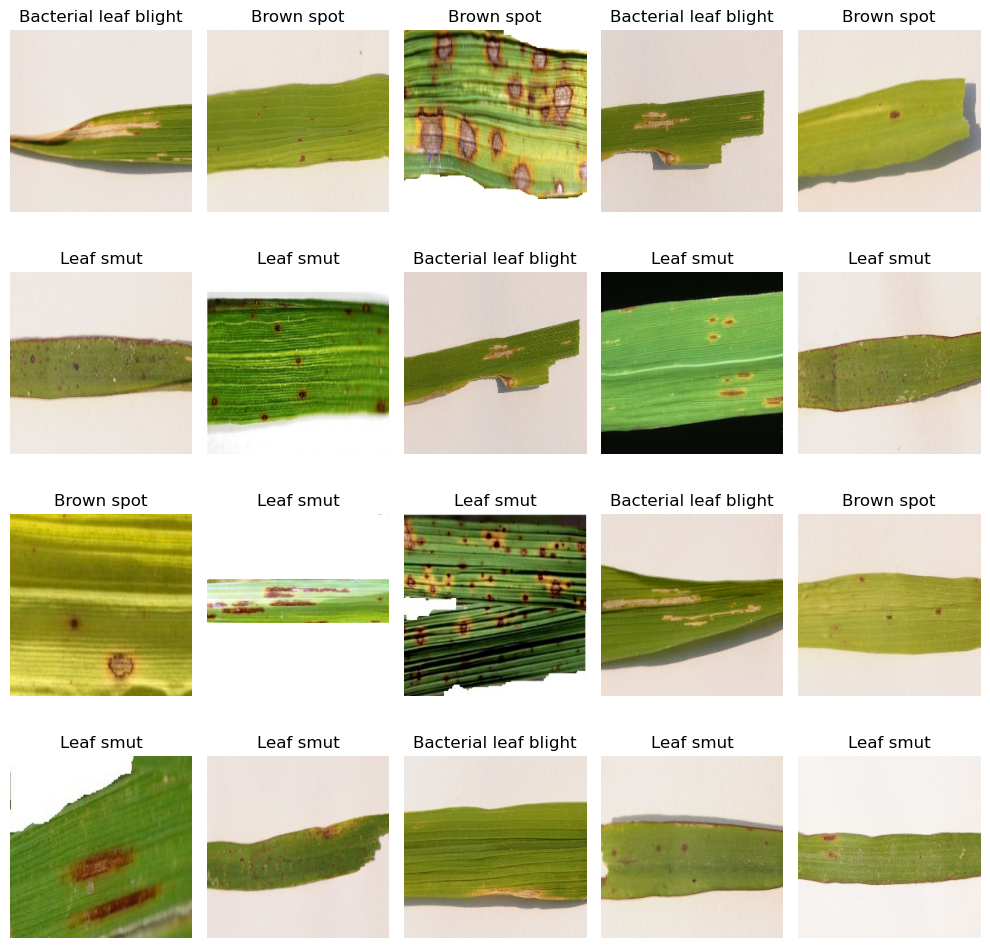

In [40]:
#displaying image batch of 50
batchs = df_riceleaf.batch(batch_size)

images, labels = next(iter(batchs))
show_images(images, labels)


# Data Preprocessing

In [26]:
X = []
y = []
for image, labels in df_riceleaf.batch(119):
    for img, lab in zip(image,labels):
        X.append(img.numpy().astype("uint8"))
        y.append(lab.numpy().astype("uint8"))
        

2024-08-15 17:09:46.893928: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [27]:
X = np.array(X)
y= np.array(y) 

In [16]:
y

array([0, 1, 1, 0, 1, 2, 2, 0, 2, 2, 1, 2, 2, 0, 1, 2, 2, 0, 2, 2, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 2, 0, 1, 0, 1, 0, 2, 0, 1, 2, 2, 1, 1, 1, 1,
       2, 2, 0, 1, 1, 2, 1, 0, 1, 0, 2, 1, 0, 0, 1, 1, 0, 0, 2, 1, 0, 2,
       2, 1, 2, 0, 0, 2, 1, 2, 1, 0, 2, 0, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1,
       1, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 1, 2, 1, 2, 0, 1, 2, 0, 0,
       2, 0, 1, 1, 0, 1, 2, 2, 0], dtype=uint8)

In [16]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = seed)

In [17]:
X_train.shape

(89, 224, 224, 3)

In [18]:
X_test.shape

(30, 224, 224, 3)

# Scaling/Normalizing 

In [ ]:

X_train = X_train/255
X_test = X_test/255

# Encoding

In [22]:
y_train = to_categorical(y_train , num_classes = len(class_names))
y_test = to_categorical(y_test, num_classes = len(class_names))

# CNN Architecture

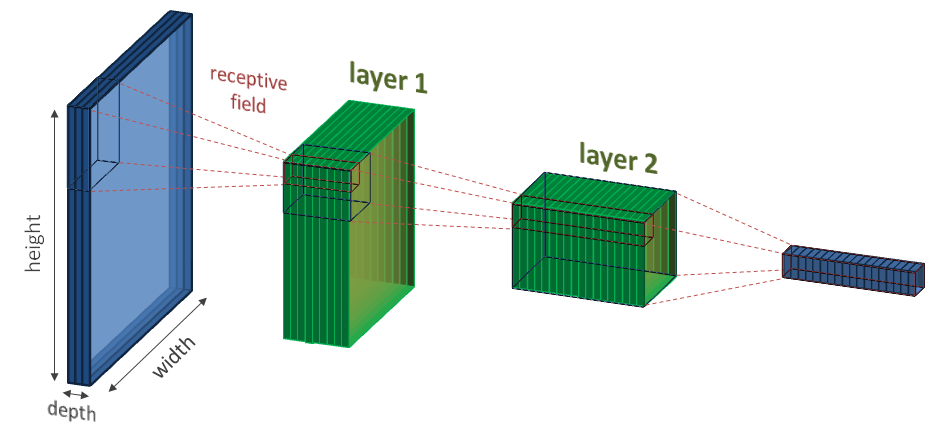

In [24]:
# Display an image file
Image(filename='cnn.png')

## Convolutional layers
Convolutional layers are the main **building blocks** of CNNs. They work by taking the **dot product** with a set of **filters** and a **sliding window** of the input image. The result is a set of local **features**, like edges and constrast, that can be helpful in describing the images. The learnable parameters are only the **weights** contained in the filters and due to their small size, these layers can be implemented quite **effeciently**

## Convolution Operation
It is nothing but component wise multiplication and addition

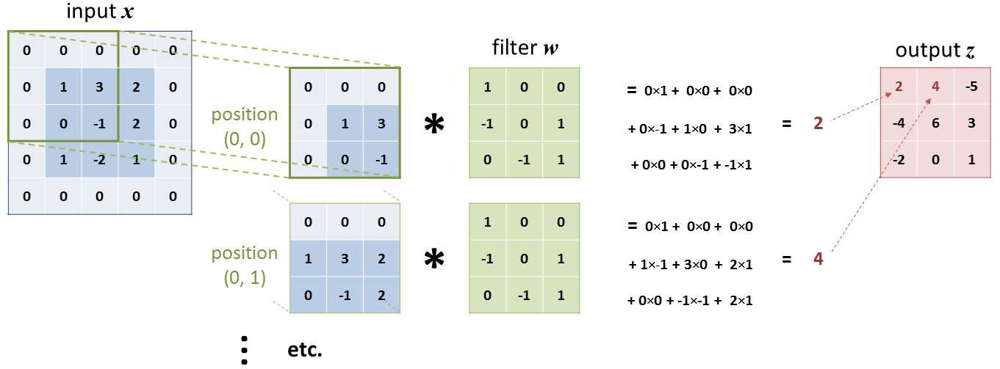

In [27]:
Image(filename='convop.png')

### Pooling Layer
The primary function of the pooling layer is to **downsample** the image sizes, e.g. from 64x64 to 32x32. It works by partitioning the image into squares and applying a **non-linear transformation** over thoses squares. The most common types of pooling are **average pooling**, where the average is taken of each square, and **max pooling**, where the maximum is taken of each square.

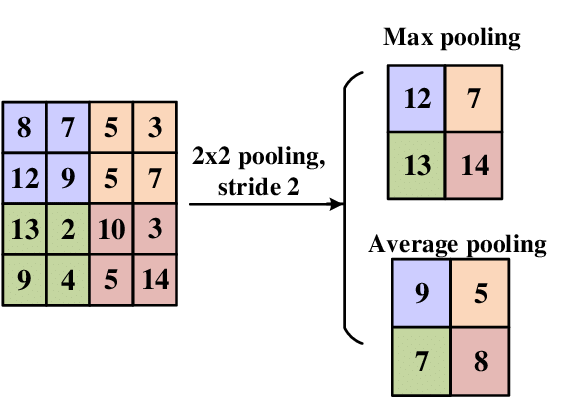

In [29]:
Image(filename='pooling_layer.png')

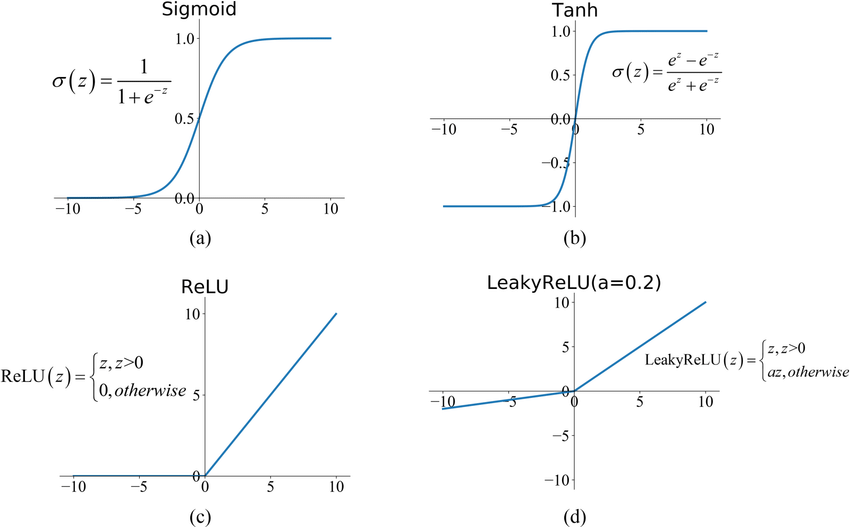

In [30]:
### Activation Function
Image(filename='activation_fun.png')

Activation functions apply a **non-linear transformation** to the previous later, which enable the model to **learn more complex relationships**. Common activation functions are the **Rectified Linear Unit (ReLU)**, hyperbolic tan (tanh) and sigmoid. For the final layer, **softmax** can be used to produce predicted class probabilities.

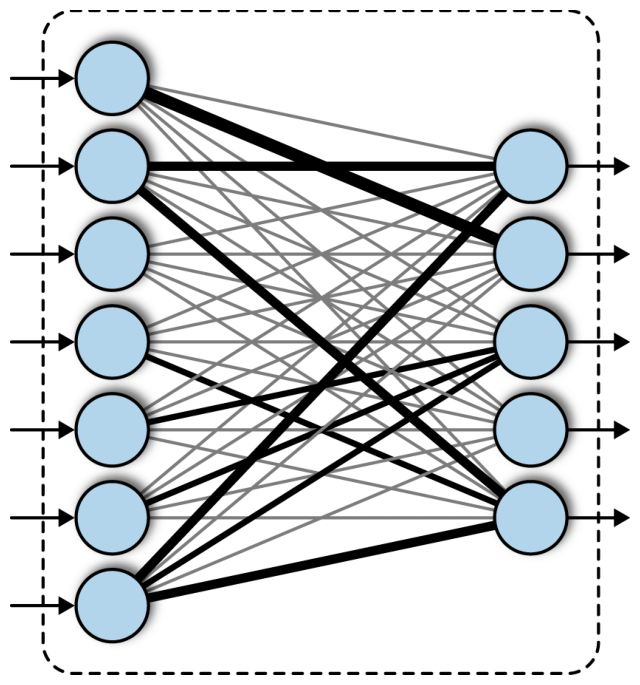

In [32]:
### Dense layer
import matplotlib.image as mpimg
plt.figure(figsize = (8,12))
# Load and display an image using Matplotlib
img = mpimg.imread('dense_layer.png')
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

Dense or **fully connected** layers are the standard layers in a neural network, where every neuron in the previous layer is connected to the current layer through weights and biases. 

### Dropout

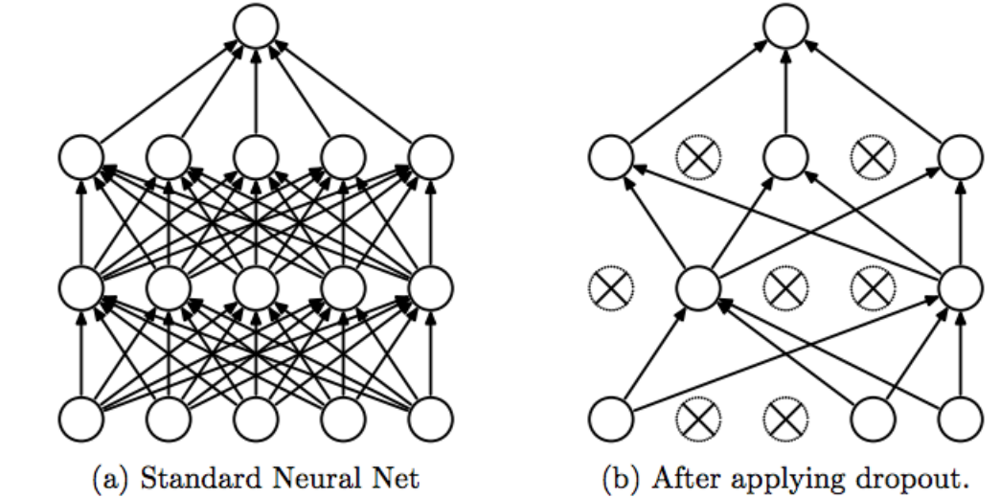

In [35]:
Image(filename='dropout.png')

Dropout is a clever way to **prevent** your model from **overfitting** the training data by **randomly 'turning off'** each neuron **independently** with some probability p. The result is that the model cannot rely on any particular neuron and instead has to make predictions using several different neurons. 

### Data Augmentation
Training deep convolutional networks with a limited dataset can be challenging due to overfitting. To overcome this, AlexNet used the data augmentation approach to increase the size of the training dataset artificially. Data augmentation creates new images by randomly altering the original images. Alterations include cropping, flipping, rotating, adding noise, and changing the colors of the original images.

The data augmentation approach significantly increases the size and quality of the training dataset in the AlexNet model, leading to increased generalization, improved training speed and accuracy, and addressing overfitting

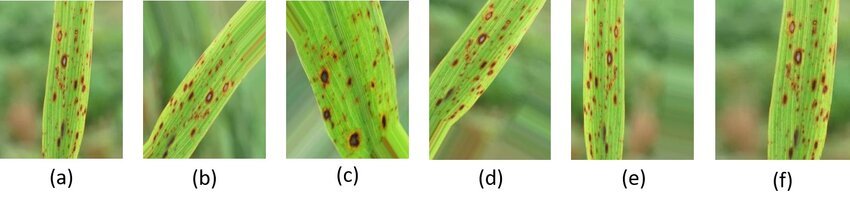

In [38]:
Image(filename='augmented.png')

In [ ]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train, y_train)
test_itr = testdatagen.flow(X_train, y_train)

# 1. Custom 5 layer CNN

In [42]:
def five_layer_cnn():
    model = Sequential([
        keras.Input(shape = input_shape_3D),
        
        # 1st Convolutional Layer
        Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
    
        # 2nd Convolutional Layer
        Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
    
        # 3rd Convolutional Layer
        Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
    
        # 4th Convolutional Layer
        Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
    
        # 5th Convolutional Layer
        Conv2D(filters=256, kernel_size=(3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
    
        # Flatten the output and pass it to the fully connected layer
        Flatten(),
    
        # Fully Connected Layer (Dense Layer)
        Dense(units=512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
    
        # Output Layer
        Dense(units=3, activation='softmax')
    ])
 
    return model


In [43]:
model = five_layer_cnn()

In [44]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 10, 10, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 10, 10, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6400)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,819,331 (14.57 MB)

 Trainable params: 3,817,091 (14.56 MB)

 Non-trainable params: 2,240 (8.75 KB)

In [49]:
import os
os.environ["PATH"] += os.pathsep + '/opt/homebrew/bin'
import matplotlib.image as mpimg


In [157]:
from tensorflow.keras.utils import plot_model

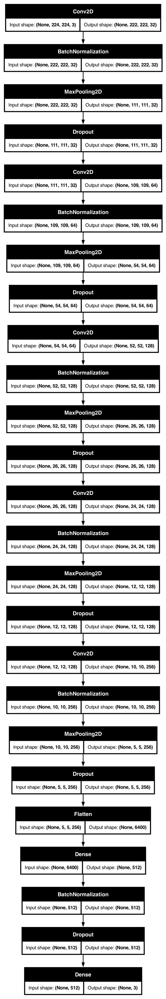

In [47]:
plot_model(model,'model.png', show_shapes = True)
img = mpimg.imread('model.png')
plt.figure(figsize=(10,50))  # Set your desired figsize here
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

In [48]:
model.compile(optimizer = 'Adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [49]:
import os
import datetime
! rm -rf ./logs/
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(logdir)

logs/20240814-000055


In [8]:
%load_ext tensorboard
%tensorboard --logdir $logdir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 3039), started 0:00:28 ago. (Use '!kill 3039' to kill it.)

In [51]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq = 1)

In [52]:
history = model.fit(train_itr, epochs = 50, validation_data = test_itr, callbacks = [tensorboard_callback])

Epoch 1/50


2024-08-14 00:00:58.876172: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 777ms/step - accuracy: 0.3900 - loss: 2.1656 - val_accuracy: 0.3258 - val_loss: 5.7404
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 458ms/step - accuracy: 0.6366 - loss: 1.4895 - val_accuracy: 0.3371 - val_loss: 11.5505
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 531ms/step - accuracy: 0.7150 - loss: 1.1206 - val_accuracy: 0.3258 - val_loss: 4.7069
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 442ms/step - accuracy: 0.7269 - loss: 0.9487 - val_accuracy: 0.3708 - val_loss: 3.0543
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step - accuracy: 0.7038 - loss: 1.2204 - val_accuracy: 0.3258 - val_loss: 5.0627
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 444ms/step - accuracy: 0.8112 - loss: 0.6894 - val_accuracy: 0.3708 - val_loss: 6.7487
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 491ms/step - accuracy: 0.7725 - loss: 0.6670 - val_accuracy: 0.3483 - val_loss: 7.4560
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 441ms/step - accuracy: 0.8562 - loss: 0.4601 - val_accuracy: 0.3371 - val_loss: 6.5208
Ep

In [115]:
y_pred = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


In [125]:
score = model.evaluate(X_test, y_test, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4000 - loss: 4.1684


In [129]:
print('loss',score[0])
print('accuracy',score[1])

loss 4.168392658233643
accuracy 0.4000000059604645


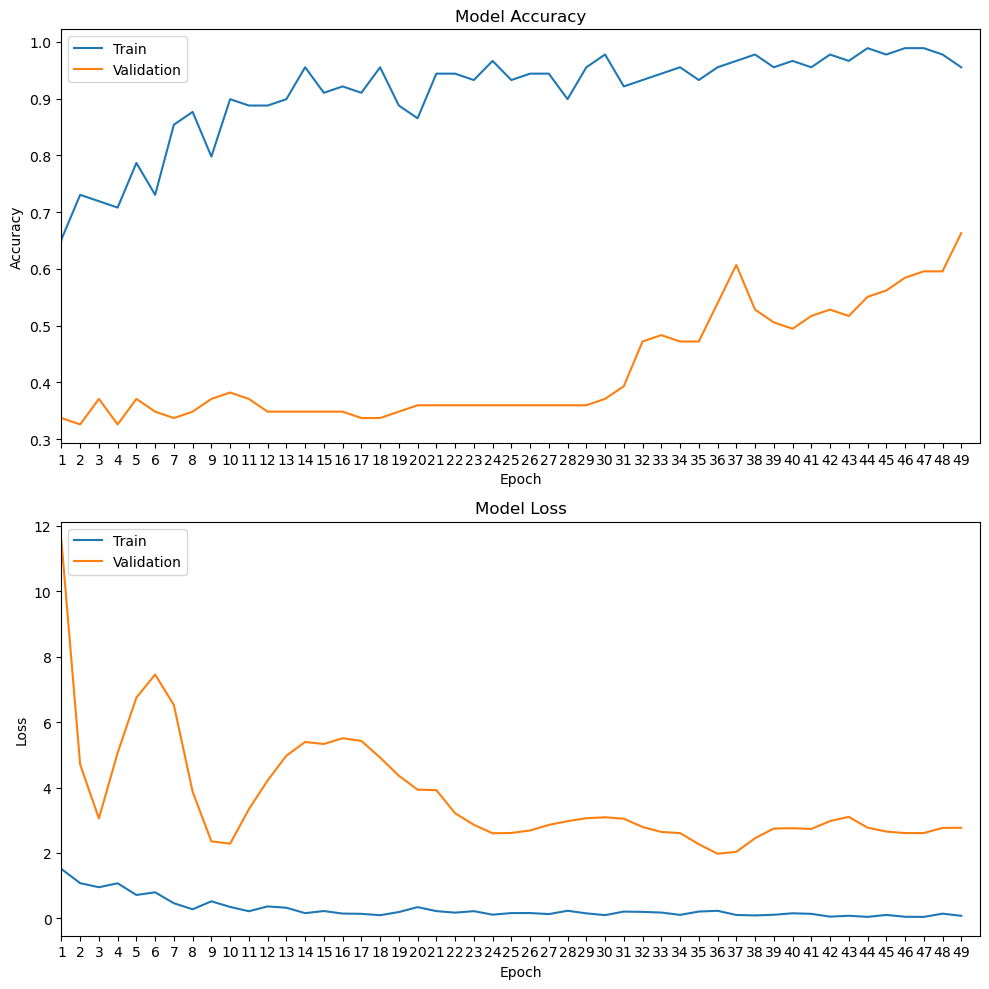

In [111]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

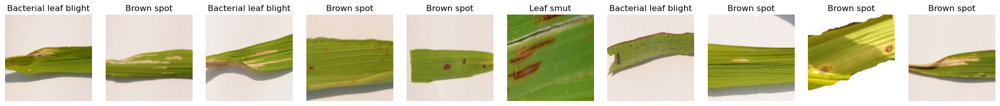

In [325]:
num_images = 10
pred_classes = np.argmax(y_pred, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i], cmap='gray')
    plt.title(f"{label_to_class_name[pred_classes[i]]}")
    plt.axis('off')
    

plt.tight_layout()
plt.show()

In [13]:
def confusion_matrixes(test_classes, pred_classes):
    l = [ label_to_class_name[x] for x in list(pred_classes)]
    test_cm = confusion_matrix(test_classes, pred_classes)
    df_test = pd.DataFrame(test_cm,index = list(label_to_class_name.values()) , columns= label_to_class_name.values())
    plt.figure(figsize=(8, 6))
    sns.heatmap(df_test, annot=True, cmap='inferno', fmt='d')
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

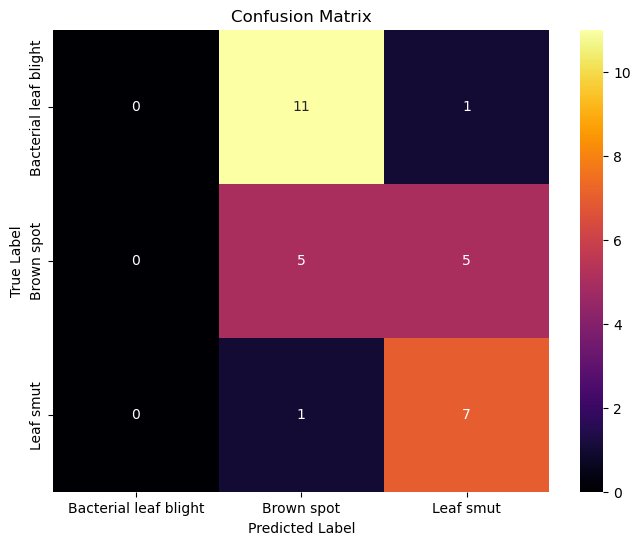

In [264]:
test_classes = np.argmax(y_test, axis = 1)
confusion_matrixes(test_classes,pred_classes)

### We can clearly see that model is overfitted because it is good at traning dataset with accuray of 0.96 , in test dataset it has accuray of 0.69

## Keras Hyperparameter tuning

In [285]:


def build_model(hp):
    model = Sequential([
        # Input layer (handled by first Conv2D layer)
        keras.Input(shape=input_shape_3D),

        # 1st Convolutional Layer
        Conv2D(filters=hp.Int('conv1_filters', min_value=32, max_value=128, step=32),kernel_size=(3, 3),activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('conv1_dropout', min_value=0.1, max_value=0.5, step=0.1)),

        # 2nd Convolutional Layer
        Conv2D(filters=hp.Int('conv2_filters', min_value=64, max_value=256, step=64),kernel_size=(3, 3),activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('conv2_dropout', min_value=0.1, max_value=0.5, step=0.1)),

        # 3rd Convolutional Layer
        Conv2D(filters=hp.Int('conv3_filters', min_value=128, max_value=512, step=128),kernel_size=(3, 3),activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('conv3_dropout', min_value=0.1, max_value=0.5, step=0.1)),

        # 4th Convolutional Layer
        Conv2D(filters=hp.Int('conv4_filters', min_value=128, max_value=512, step=128),kernel_size=(3, 3),activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('conv4_dropout', min_value=0.1, max_value=0.5, step=0.1)),

        # 5th Convolutional Layer
        Conv2D(filters=hp.Int('conv5_filters', min_value=256, max_value=512, step=128),kernel_size=(3, 3),activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('conv5_dropout', min_value=0.1, max_value=0.5, step=0.1)),

        # Flatten the output
        Flatten(),

        # Fully Connected Layer
        Dense(units=hp.Int('dense_units', min_value=128, max_value=1024, step=128),activation='relu'),
        BatchNormalization(),
        Dropout(hp.Float('dense_dropout', min_value=0.3, max_value=0.7, step=0.1)),

        # Output Layer
        Dense(units=3, activation='softmax')
    ])

    # Compile the model
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Define the tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='tuning',
    project_name='rice_Leaf_Disease'
)

# Perform hyperparameter search
tuner.search(train_itr, epochs=10, validation_data= test_itr)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]


Trial 10 Complete [00h 00m 46s]
val_accuracy: 0.37078651785850525

Best val_accuracy So Far: 0.516853928565979
Total elapsed time: 00h 07m 06s


In [293]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 96)   │         2,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 96)   │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 96)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 96)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 256)  │       221,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 54, 54, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 384)    │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 384)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 12, 12, 384)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 10, 10, 512)    │     1,769,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 10, 10, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 6,754,179 (25.77 MB)

 Trainable params: 6,750,659 (25.75 MB)

 Non-trainable params: 3,520 (13.75 KB)

In [311]:
import os
import datetime
! rm -rf ./logs/
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(logdir)

logs/20240814-023509


In [6]:
%load_ext tensorboard
%tensorboard --logdir $logdir

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq = 1)

In [299]:
history = best_model.fit(train_itr, epochs = 50, validation_data = test_itr, callbacks = [tensorboard_callback])

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.7450 - loss: 0.7245 - val_accuracy: 0.3596 - val_loss: 79.7729
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8078 - loss: 0.5396 - val_accuracy: 0.3596 - val_loss: 106.1978
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8250 - loss: 0.4487 - val_accuracy: 0.3371 - val_loss: 134.7610
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.7875 - loss: 0.6660 - val_accuracy: 0.3371 - val_loss: 202.3922
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8540 - loss: 0.3637 - val_accuracy: 0.3596 - val_loss: 121.2915
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8475 - loss: 0.3377 - val_accuracy: 0.3483 - val_loss: 87.6571
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8623 - loss: 0.4990 - val_accuracy: 0.3371 - val_loss: 97.4102
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8944 - loss: 0.2578 - val_accuracy: 0.3371 - val_loss: 79.6139
Epoc

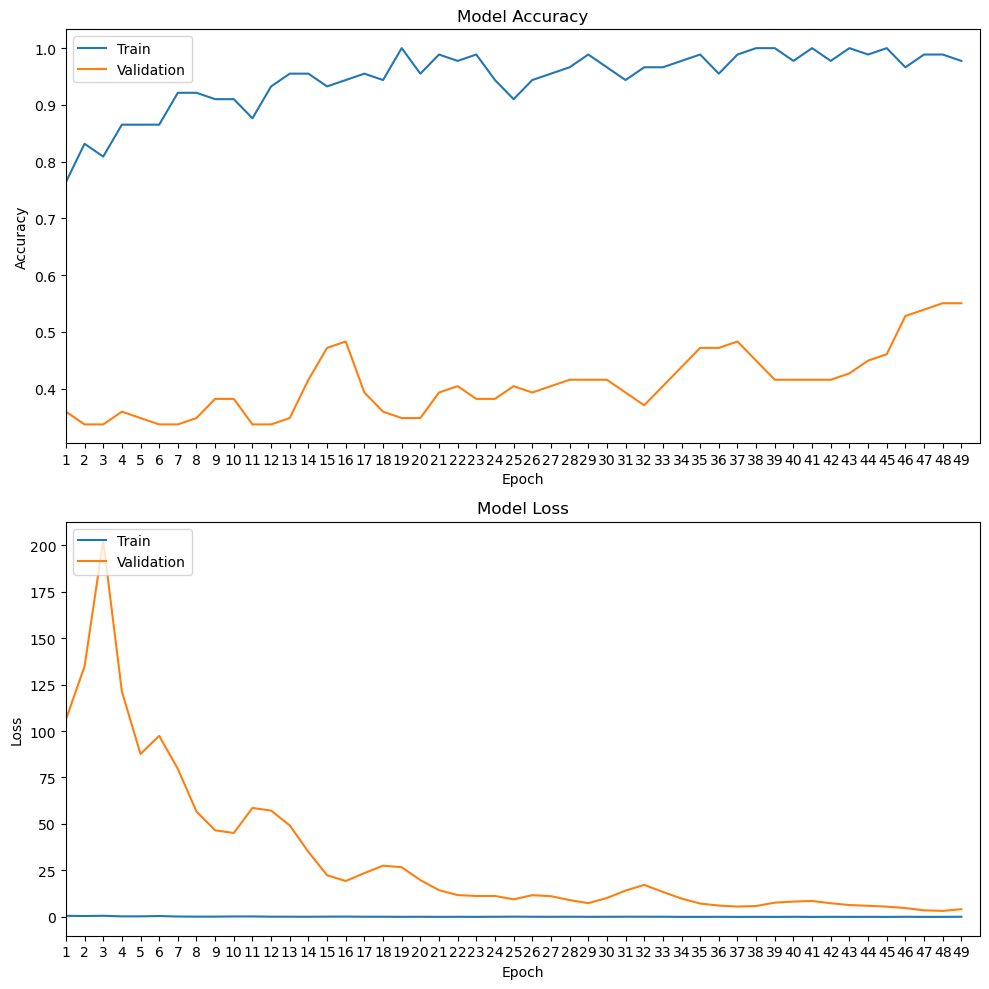

In [301]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [317]:
y_pred = best_model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


In [321]:
score = best_model.evaluate(X_test, y_test, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.5667 - loss: 3.5169


In [323]:
print('loss',score[0])
print('accuracy',score[1])

loss 3.516944169998169
accuracy 0.5666666626930237


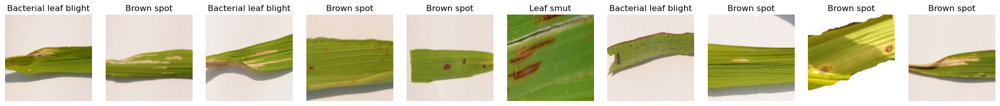

In [327]:
num_images = 10
pred_classes = np.argmax(y_pred, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i], cmap='gray')
    plt.title(f"{label_to_class_name[pred_classes[i]]}")
    plt.axis('off')
    

plt.tight_layout()
plt.show()

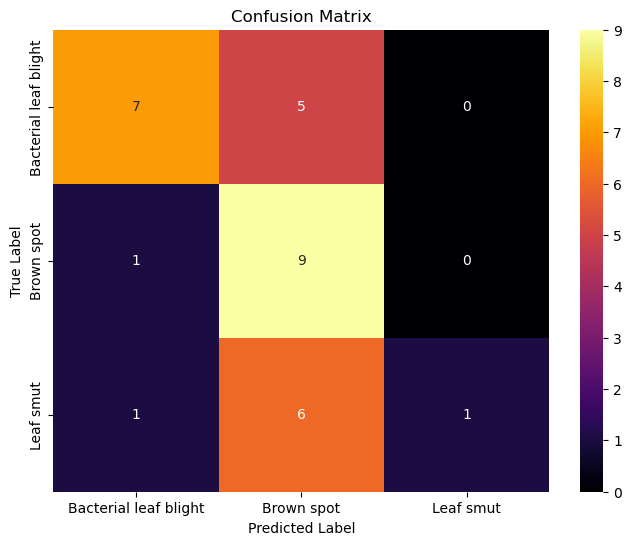

In [329]:
test_classes = np.argmax(y_test, axis = 1)
confusion_matrixes(test_classes,pred_classes)

## we can see little bit imporvement in the model having 56% accuracy and loss of 3.5 in test dataset

# Transfer Learning

### Approch => Fine Tuning 

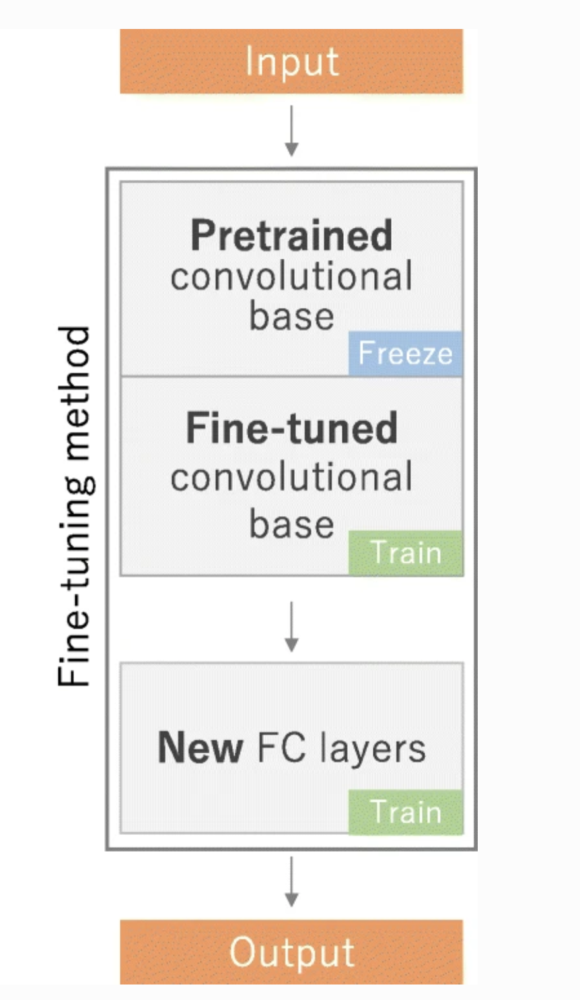

In [12]:
Image(filename='finetuning.png',width=200, height=100)

## VGG16

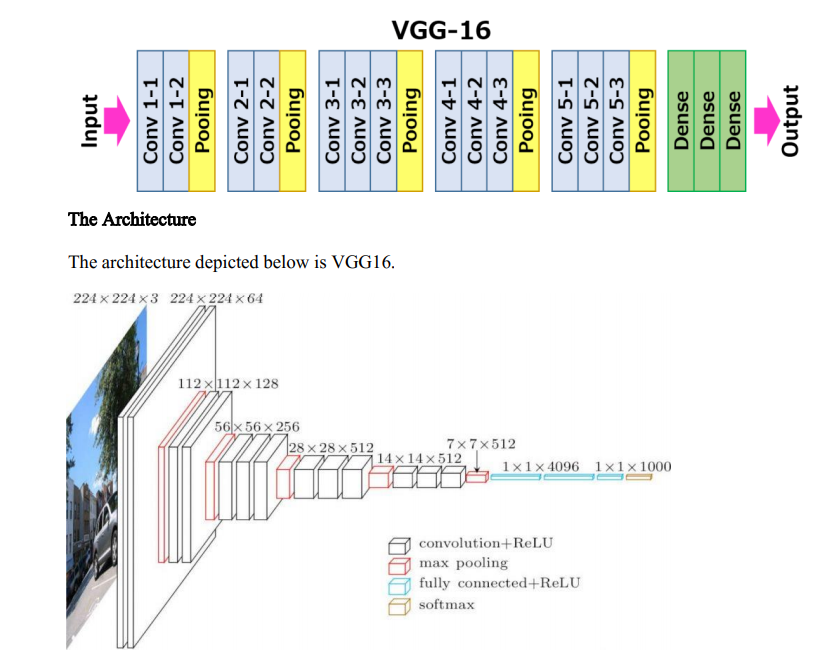

In [20]:
Image(filename='vgg16.png')

VGG16 is a popular convolutional neural network (CNN) architecture that was designed by the Visual Geometry Group (VGG) from the University of Oxford. It is known for its simplicity and depth, which made it a significant model in the development of deep learning techniques for image classification. Here's an overview of the VGG16 architecture:

__Key Features of VGG16__
**Depth:** VGG16 consists of 16 layers that have weights. These layers include 13 convolutional layers and 3 fully connected layers.

__Convolutional Layers:__
The network uses very small receptive fields (3x3 filters) throughout the convolutional layers.
Convolutional layers are stacked on top of each other in increasing depth. The depth of the network increases from 64 to 128, 256, 512, and finally 512 feature maps.

__Pooling Layers:__
Max pooling is performed over a 2x2 pixel window, with a stride of 2.
Pooling layers are interspersed between groups of convolutional layers to progressively reduce the spatial dimensions of the feature maps.
Fully Connected Layers:

The three fully connected layers follow the convolutional layers. The first two have 4096 channels each, while the third performs 1000-way ILSVRC classification and thus contains 1000 channels (one for each class).
The final layer is a softmax layer to output the class probabilities.

__Activation Function:__
ReLU (Rectified Linear Unit) activation function is used after every convolution and fully connected layer.

__Input:__
The input to VGG16 is a fixed-size 224x224 RGB image.
Preprocessing involves subtracting the mean RGB value from each pixel.

In [30]:
X.shape

(119, 224, 224, 3)

In [32]:
X_train_vgg16, X_test_vgg16, y_train_vgg16, y_test_vgg16 = train_test_split(X,y, random_state = seed)

In [34]:
X_train_vgg16.shape

(89, 224, 224, 3)

# Scaling/Normalization

In [37]:
X_train = X_train_vgg16/255
X_test = X_test_vgg16/255

# Encoding

In [40]:
y_train_vgg16 = to_categorical(y_train_vgg16 , num_classes = 3 )
y_test_vgg16 = to_categorical(y_test_vgg16, num_classes = 3 )

# Data Aggumentation

In [43]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_vgg16, y_train_vgg16)
test_itr = testdatagen.flow(X_test_vgg16, y_test_vgg16)

# Model

In [46]:
input_shape = (224,224,3)

base_model = keras.applications.VGG16(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

In [47]:
len(base_model.layers)


20

In [50]:
base_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 512)            │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
base_model.trainable = True

fine_tune_at = 10
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [54]:
# building fully connected layers

vgg16_model= Sequential()

vgg16_model.add(Input(shape=input_shape))

vgg16_model.add(base_model)

vgg16_model.add(Flatten())

vgg16_model.add(Dense(512, activation='relu'))
vgg16_model.add(Dense(3, activation='softmax'))

vgg16_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])



In [56]:
vgg16_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,978,883 (57.14 MB)

 Trainable params: 13,243,395 (50.52 MB)

 Non-trainable params: 1,735,488 (6.62 MB)

In [58]:
tf.keras.utils.plot_model(
    vgg16_model,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [60]:
# tf.keras.backend.clear_session(
#     free_memory=True
# )

In [62]:
history = vgg16_model.fit(train_itr, epochs=50,validation_data = test_itr, verbose=1)

Epoch 1/50


2024-08-15 17:10:14.357465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 933ms/step - accuracy: 0.4675 - loss: 94.2416 - val_accuracy: 0.3667 - val_loss: 73.3008
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 835ms/step - accuracy: 0.2706 - loss: 75.7560 - val_accuracy: 0.3667 - val_loss: 26.7503
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 840ms/step - accuracy: 0.2562 - loss: 41.1578 - val_accuracy: 0.4000 - val_loss: 14.3062
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 781ms/step - accuracy: 0.3056 - loss: 11.3678 - val_accuracy: 0.3667 - val_loss: 1.2999
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 782ms/step - accuracy: 0.2500 - loss: 1.4385 - val_accuracy: 0.2333 - val_loss: 1.6197
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 790ms/step - accuracy: 0.3922 - loss: 1.2707 - val_accuracy: 0.3000 - val_loss: 1.1367
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 783ms/step - accuracy: 0.3258 - loss: 1.3933 - val_accuracy: 0.3667 - val_loss: 1.5280
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 782ms/step - accuracy: 0.3031 - loss: 1.5104 - val_accuracy: 0.3667 - val_loss: 1.2

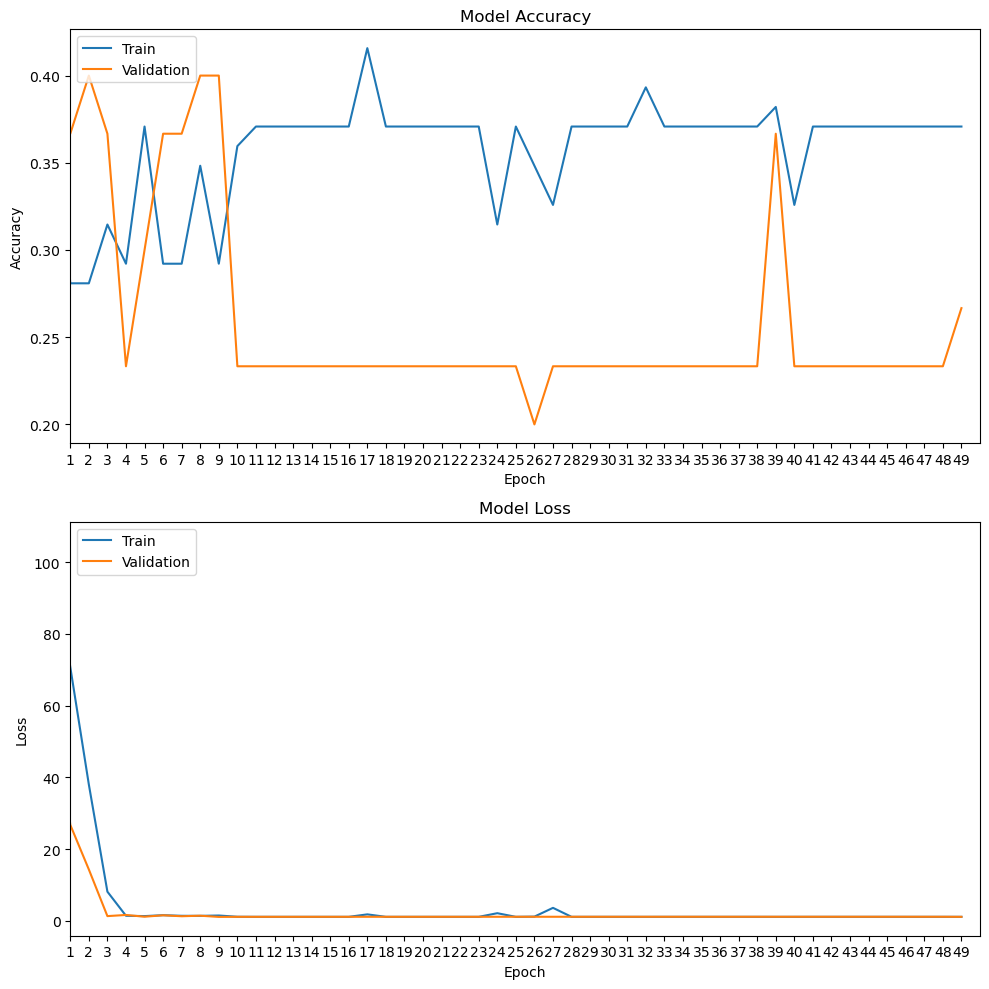

In [64]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [66]:
y_pred_vgg = vgg16_model.predict(X_test_vgg16)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


In [68]:
score = vgg16_model.evaluate(X_test_vgg16, y_test_vgg16, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - accuracy: 0.2667 - loss: 1.0998


In [70]:
print('loss',score[0])
print('accuracy',score[1])

loss 1.0997604131698608
accuracy 0.2666666805744171


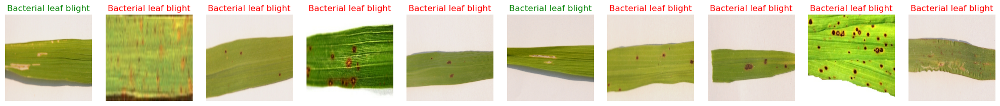

In [72]:
test_classes = np.argmax(y_test_vgg16, axis = 1)

num_images = 10
pred_classes = np.argmax(y_pred_vgg, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i])
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

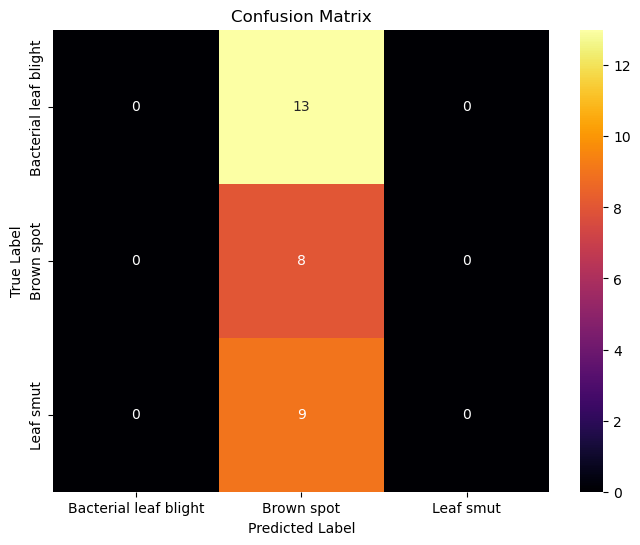

In [241]:
confusion_matrixes(test_classes,pred_classes)

### we can here see that how badly VGG16 is performing in test Dataset with accuracy of 26% and loss of 1.113

# ResNet50

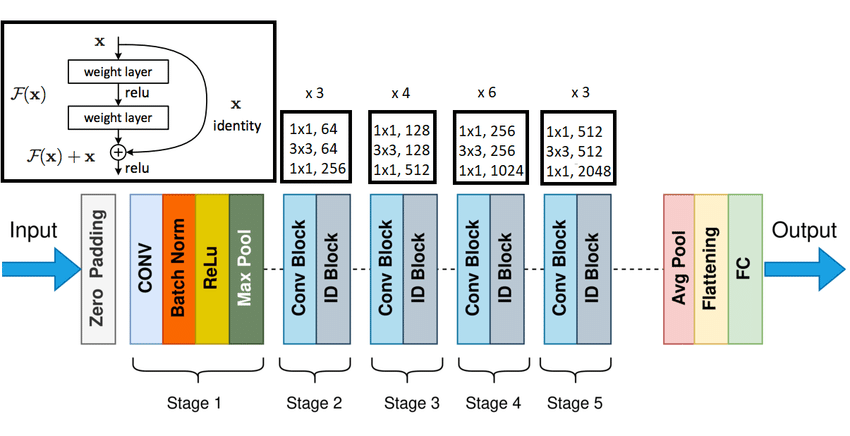

In [247]:
Image(filename='resnet.png')

The ResNet-50 architecture is a deep convolutional neural network designed to address the vanishing gradient problem, allowing the construction and training of very deep networks. Here's a detailed overview of its architecture:

__Layers Breakdown__

__Initial Convolution and Max Pooling Layers:__
__Conv1:__  7x7 convolution with 64 filters, stride 2, followed by batch normalization and ReLU activation.
__Max Pooling:__ 3x3 max pooling with a stride of 2.

__Residual Blocks (Building Blocks):__

The core component of ResNet-50 is the residual block, which typically consists of three convolutional layers.
Each block can be represented as Conv3x3 -> Conv3x3 -> Conv1x1, with a shortcut connection adding the input of the block to its output.
Convolutional Layers by Stage:

__Stage 2:__
3 residual blocks, each containing:
1x1 convolution with 64 filters.
3x3 convolution with 64 filters.
1x1 convolution with 256 filters.

__Stage 3:__
4 residual blocks, each containing:
1x1 convolution with 128 filters.
3x3 convolution with 128 filters.
1x1 convolution with 512 filters.

__Stage 4:__ 
6 residual blocks, each containing:
1x1 convolution with 256 filters.
3x3 convolution with 256 filters.
1x1 convolution with 1024 filters.

__Stage 5:__
3 residual blocks, each containing:
1x1 convolution with 512 filters.
3x3 convolution with 512 filters.
1x1 convolution with 2048 filters.

Fully Connected Layer:

After the convolutional stages, a global average pooling layer is applied to reduce the spatial dimensions to 1x1.
A fully connected layer with 1000 neurons (for 1000 classes in the ImageNet dataset) follows, ending with a softmax activation function for classification.

__Architecture Diagram__

Conv1: 7x7, 64, stride 2
Max Pooling: 3x3, stride 2
Stage 2: 3x (1x1, 64) -> (3x3, 64) -> (1x1, 256)
Stage 3: 4x (1x1, 128) -> (3x3, 128) -> (1x1, 512)
Stage 4: 6x (1x1, 256) -> (3x3, 256) -> (1x1, 1024)
Stage 5: 3x (1x1, 512) -> (3x3, 512) -> (1x1, 2048)
Global Average Pooling
Fully Connected Layer (1000 classes)

__Key Concepts__
Residual Learning: The key idea is to let the layers fit a residual mapping instead of directly trying to fit the desired underlying mapping. This is done using shortcut connections that skip one or more layers.
Bottleneck Design: Each residual block uses a bottleneck design, which consists of three layers instead of the standard two-layer design to make the network more efficient and deeper.


In [387]:
X_train_resnet50,X_test_resnet50, y_train_resnet50, y_test_resnet50 = train_test_split(X,y, random_state = seed)

In [389]:
# X_train_resnet50 = X_train_resnet50/255
# X_test_resnet50 = X_test_resnet50/255

In [391]:
y_train_resnet50 = to_categorical(y_train_resnet50 , num_classes = 3 )
y_test_resnet50 = to_categorical(y_test_resnet50, num_classes = 3 )

In [393]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_resnet50, y_train_resnet50)
test_itr = testdatagen.flow(X_test_resnet50, y_test_resnet50)

In [395]:
input_shape = (224,224,3)
base_model = keras.applications.ResNet50(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

In [397]:
len(base_model.layers)

176

In [399]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [401]:
base_model.trainable = True

fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [403]:
# building fully connected layers
def Resnet50():
    resnet50= Sequential()
    
    resnet50.add(Input(shape=input_shape))
    
    resnet50.add(base_model)
    
    resnet50.add(Flatten())
    
    resnet50.add(Dense(512, activation='relu'))
    resnet50.add(Dense(3, activation='softmax'))
    
    resnet50.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return resnet50

In [405]:
resnet = Resnet50()

In [407]:
resnet.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,638,339 (93.99 MB)

 Trainable params: 20,503,555 (78.21 MB)

 Non-trainable params: 4,134,784 (15.77 MB)

In [409]:
# tf.keras.backend.clear_session()

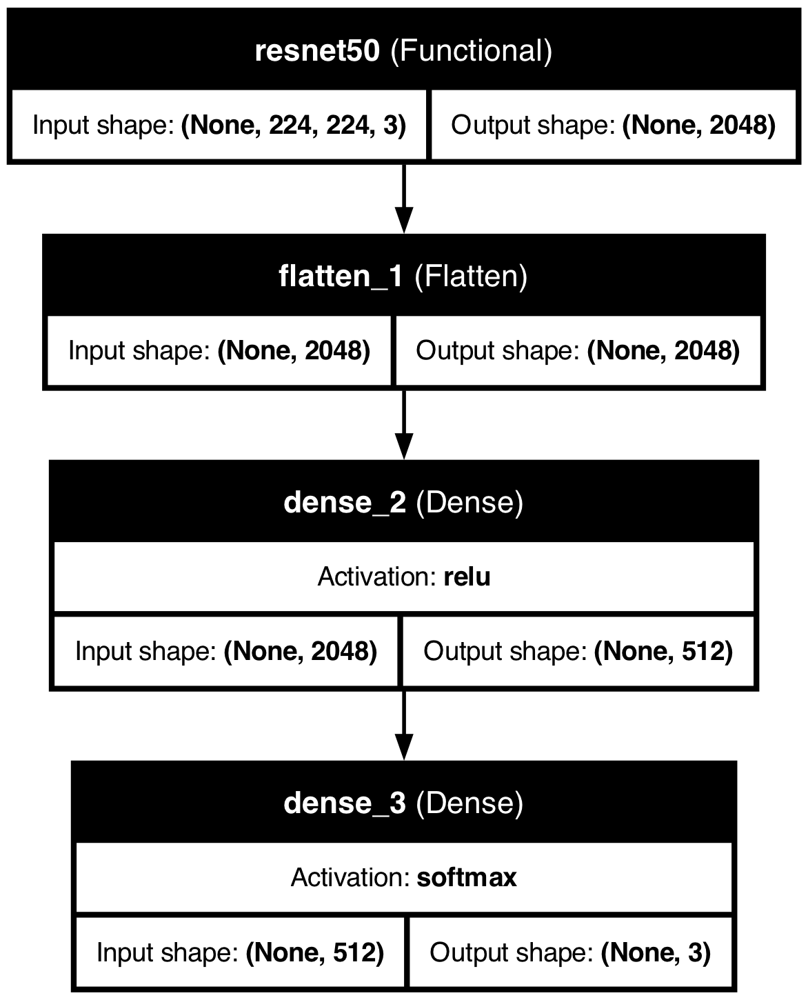

In [411]:
tf.keras.utils.plot_model(
    resnet,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

In [413]:
history = resnet.fit(train_itr, epochs=50,validation_data = test_itr, verbose=1)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - accuracy: 0.4015 - loss: 27.6256 - val_accuracy: 0.4667 - val_loss: 30.0149
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 805ms/step - accuracy: 0.6325 - loss: 7.1399 - val_accuracy: 0.6667 - val_loss: 43.4450
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 675ms/step - accuracy: 0.7916 - loss: 2.4310 - val_accuracy: 0.6667 - val_loss: 115.4603
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 652ms/step - accuracy: 0.9165 - loss: 0.4072 - val_accuracy: 0.6000 - val_loss: 614.2928
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 608ms/step - accuracy: 0.9597 - loss: 0.1392 - val_accuracy: 0.6333 - val_loss: 1153.4758
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 627ms/step - accuracy: 0.9575 - loss: 0.2822 - val_accuracy: 0.5667 - val_loss: 2159.3601
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 634ms/step - accuracy: 0.9388 - loss: 1.1448 - val_accuracy: 0.4333 - val_loss: 12157.3604
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 621ms/step - accuracy: 0.9744 - loss: 0.2728 - val_accuracy: 0.4

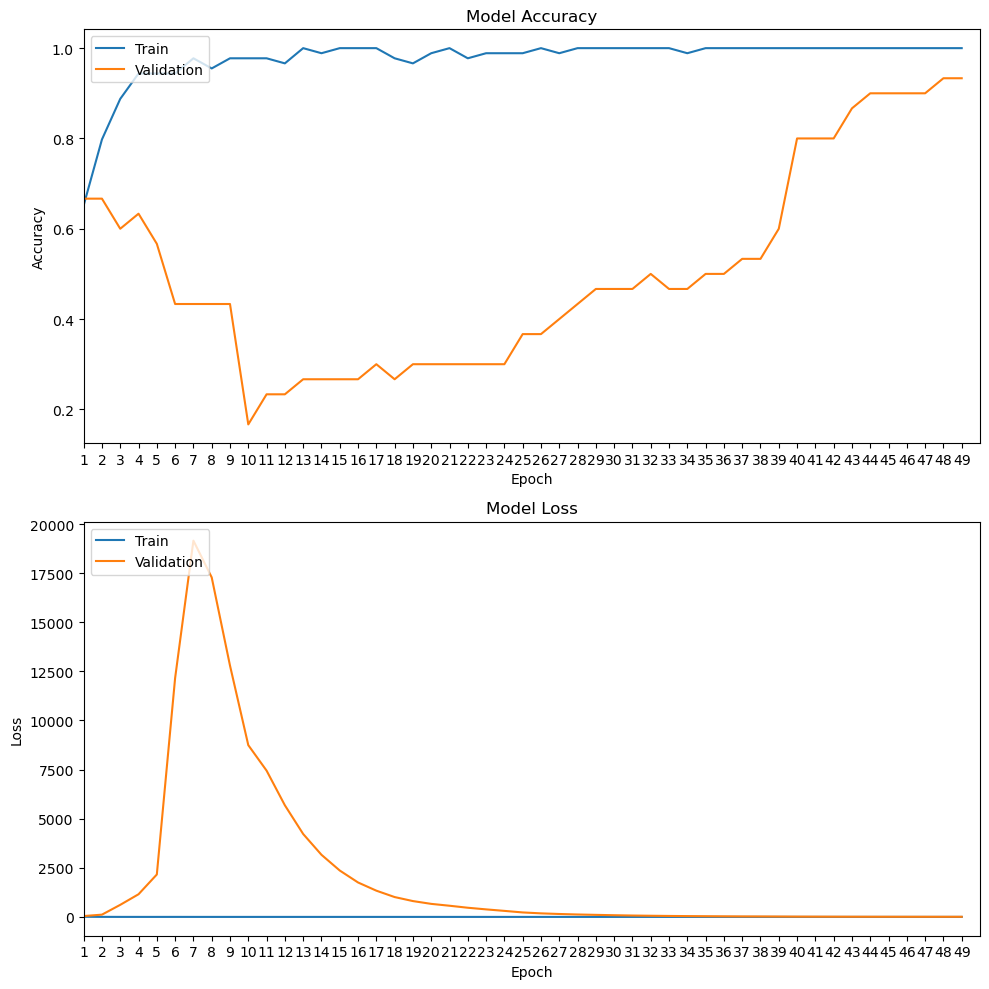

In [415]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [417]:
y_pred_resnet = resnet.predict(X_test_resnet50)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


In [418]:
score = resnet.evaluate(X_test_resnet50, y_test_resnet50, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9333 - loss: 6.3734


In [421]:
print('loss',score[0])
print('accuracy',score[1])

loss 6.3733811378479
accuracy 0.9333333373069763


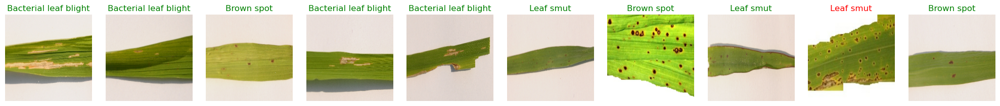

In [423]:
test_classes = np.argmax(y_test_resnet50, axis = 1)
num_images = 10
pred_classes = np.argmax(y_pred_resnet, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i])
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

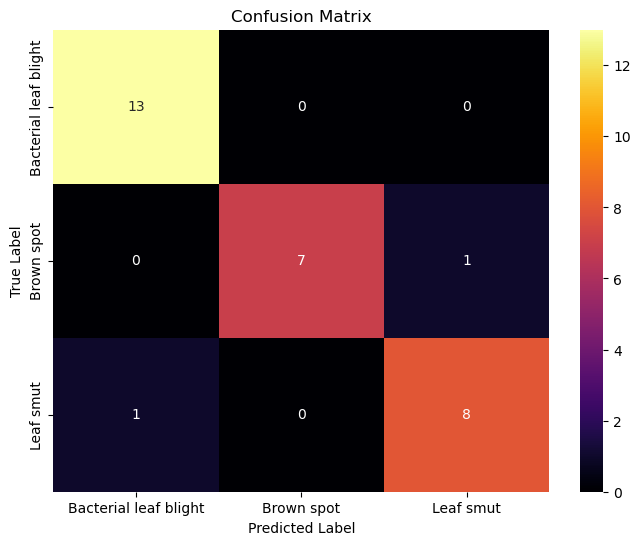

In [425]:
confusion_matrixes(test_classes,pred_classes)

### ResNet50 performing very well on Test dataset with accuray of 0.93(93%) and loss of 6.37338

# InceptionV3

__Inception v3 Architecture Summary__

Inception v3 is a deep convolutional neural network designed for image classification tasks. It builds upon the earlier Inception models (v1 and v2) with several improvements to enhance performance and efficiency.

__Key Components:__

Factorized Convolutions:

Breaks down larger convolutions into smaller ones (e.g., 3x3 into two 1x3 and 3x1), reducing computational cost and the number of parameters.

__Asymmetric Convolutions:__

Uses two consecutive 3x3 convolutions instead of a single 5x5 convolution, maintaining the receptive field with less computational expense.

__Auxiliary Classifiers:__

Adds auxiliary classifiers at intermediate layers to help combat the vanishing gradient problem and provide regularization.
Efficient Grid Size Reduction:
Combines convolutions and pooling layers to effectively reduce the spatial dimensions of feature maps.

__Label Smoothing:__

Applies label smoothing to improve generalization by preventing the network from becoming too confident in its predictions.
Architecture Breakdown:

__Stem:__

Initial layers with convolutions and pooling to preprocess the input image and reduce its dimensions.
Inception Modules:

Stacked modules that apply various convolution filters and pooling operations:

__Inception Module A:__ Combines 1x1, 3x3, and 5x5 convolutions with pooling.
__Inception Module B:__ Uses factorized convolutions like 1x7 followed by 7x1.
__Inception Module C:__ Further factorizes convolutions and combines multiple branches.

__Reduction Modules:__

Special modules to reduce spatial dimensions while increasing depth:
Reduction Module A and Reduction Module B.
Auxiliary Classifier:

An intermediate classifier to provide additional gradient signals during training.
Global Average Pooling:

Reduces each feature map to a single value by averaging over spatial dimensions.
Fully Connected Layer:

A dense layer followed by a softmax layer for final classification.


In [519]:
X_train_inception,X_test_inception, y_train_inception, y_test_inception = train_test_split(X,y, random_state = seed)

In [521]:
y_train_inception = to_categorical(y_train_inception , num_classes = 3 )
y_test_inception = to_categorical(y_test_inception, num_classes = 3 )

In [523]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_inception, y_train_inception)
test_itr = testdatagen.flow(X_test_inception, y_test_inception)

In [525]:
input_shape = (224,224,3)
base_model = keras.applications.InceptionV3(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

In [526]:
len(base_model.layers)

312

In [527]:
base_model.trainable = True

fine_tune_at = 200
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [528]:
# building fully connected layers
def inceptionv3():
    inception= Sequential()
    
    inception.add(Input(shape=input_shape))
    
    inception.add(base_model)
    
    inception.add(Dense(512, activation='relu'))
    inception.add(Dense(3, activation='softmax'))
    
    inception.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return inception

In [529]:
inception = inceptionv3()

In [535]:
inception.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 2048)           │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,853,411 (87.18 MB)

 Trainable params: 15,854,915 (60.48 MB)

 Non-trainable params: 6,998,496 (26.70 MB)

In [537]:
# tf.keras.backend.clear_session()

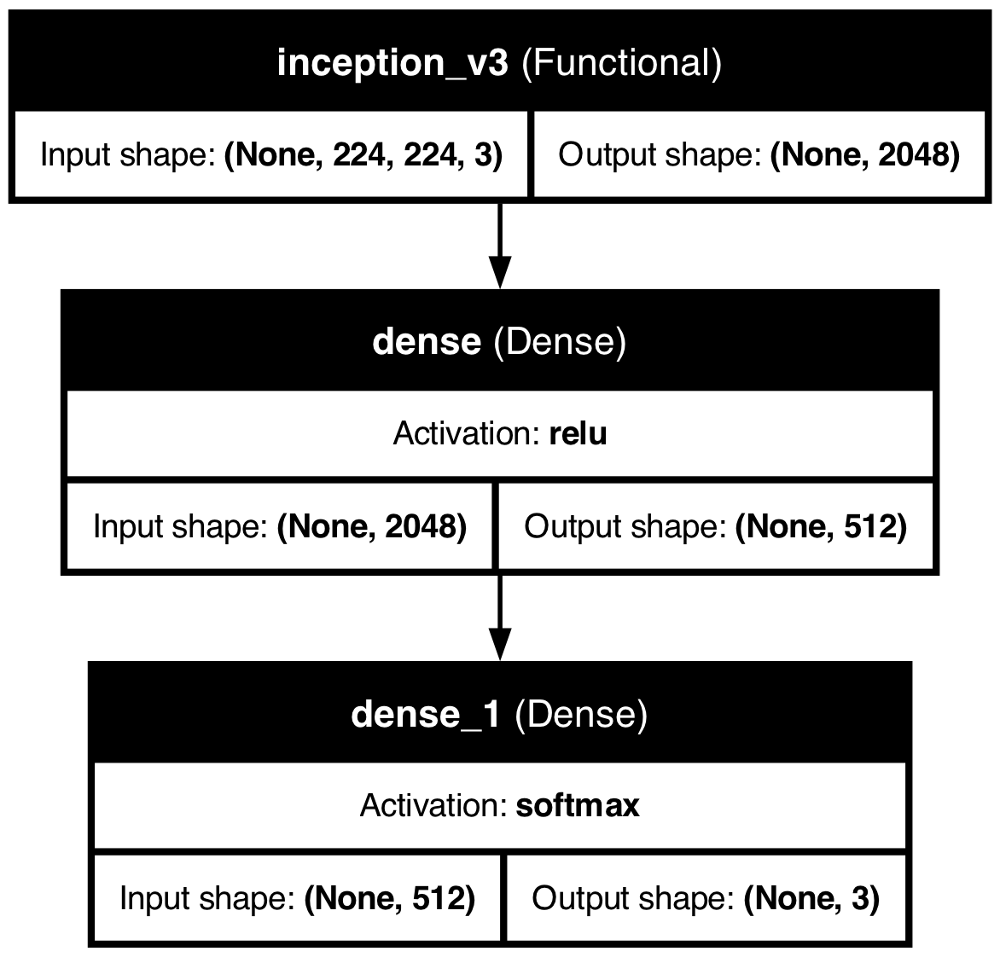

In [539]:
tf.keras.utils.plot_model(
    inception,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

In [540]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint callback
checkpoint = ModelCheckpoint('best_model.keras', 
                             monitor='val_accuracy',  # or 'val_accuracy' or any other metric
                             mode='max',          # 'min' for loss, 'max' for accuracy
                             save_best_only=True, 
                             verbose=1)


In [541]:
history = inception.fit(train_itr, epochs=50,validation_data = test_itr,callbacks=[checkpoint], verbose=1)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.2997 - loss: 9.9152 
Epoch 1: val_accuracy improved from -inf to 0.43333, saving model to best_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 7s/step - accuracy: 0.2978 - loss: 10.9005 - val_accuracy: 0.4333 - val_loss: 65.9216
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 758ms/step - accuracy: 0.3802 - loss: 7.1588
Epoch 2: val_accuracy did not improve from 0.43333
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 921ms/step - accuracy: 0.3750 - loss: 6.8967 - val_accuracy: 0.4000 - val_loss: 10.2883
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 979ms/step - accuracy: 0.4765 - loss: 1.6547
Epoch 3: val_accuracy did not improve from 0.43333
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.4669 - loss: 1.5853 - val_accuracy: 0.4333 - val_loss: 9.0355
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 511ms/step - accuracy: 0.4635 - loss: 1.2518
Epoch 4: val_accuracy did not improve from 0.43333
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 737ms/step - accuracy: 0.4600 - loss: 1.2523 - val_accur

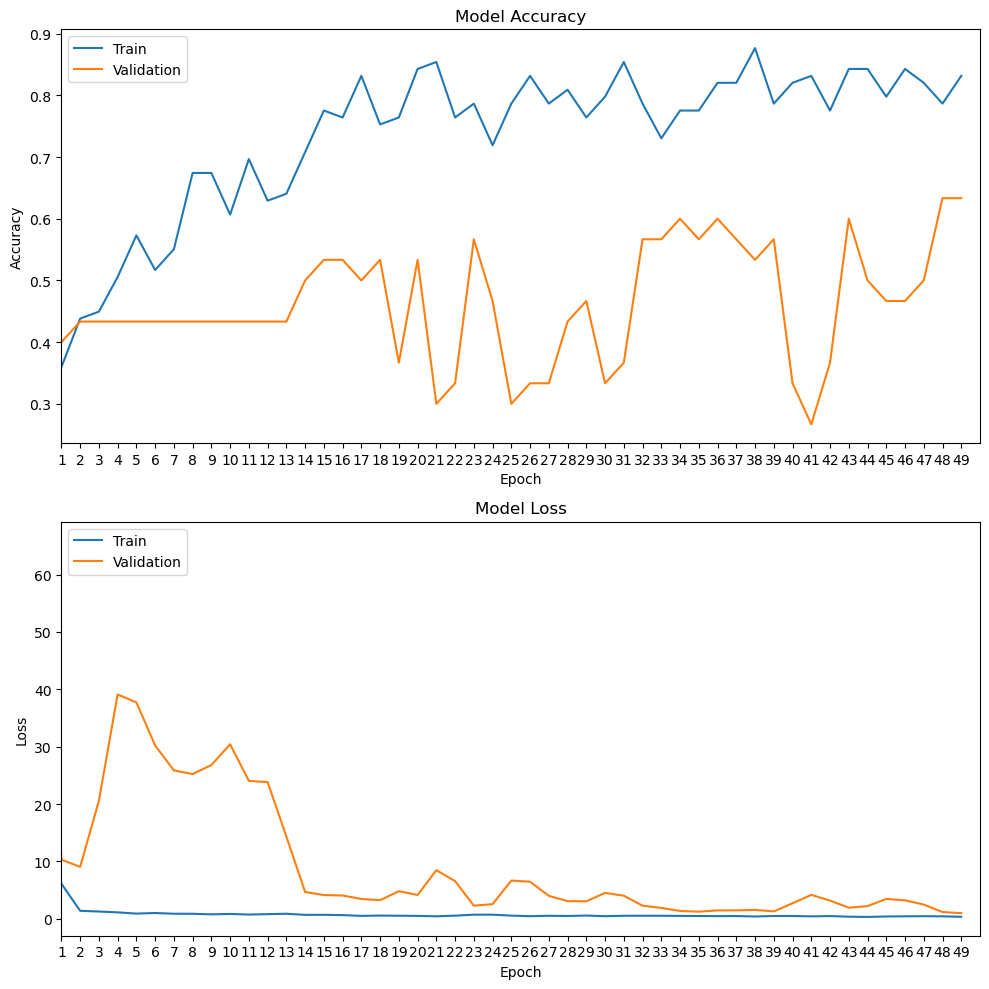

In [548]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [550]:
# from tensorflow.keras.models import load_model
# best_model = load_model('best_model.keras')


In [554]:
y_pred_inception = inception.predict(X_test_inception)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


In [556]:
score = inception.evaluate(X_test_inception, y_test_inception, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.6333 - loss: 0.9728


In [558]:
print('loss',score[0])
print('accuracy',score[1])

loss 0.9727662801742554
accuracy 0.6333333253860474


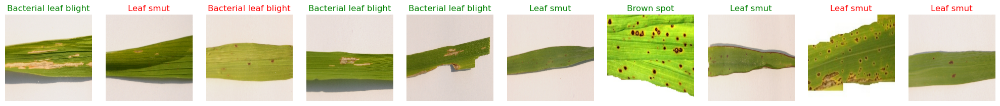

In [560]:
test_classes = np.argmax(y_test_inception, axis = 1)
num_images = 10
pred_classes = np.argmax(y_pred_inception, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i])
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

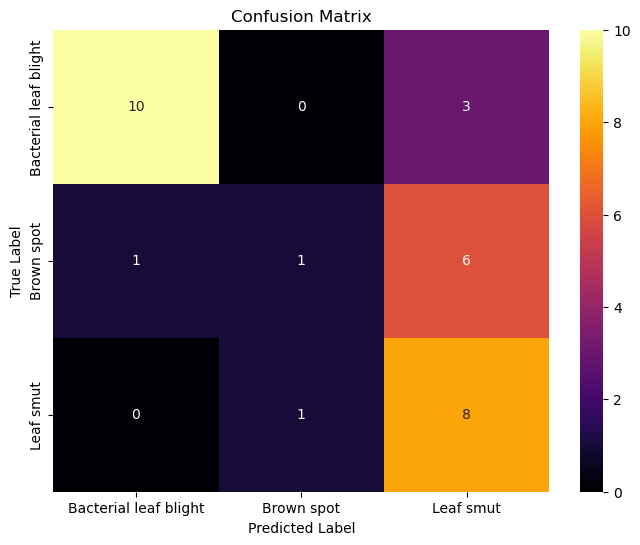

In [562]:
confusion_matrixes(test_classes,pred_classes)

### InceptionV3 performing well on Test dataset with accuray of 0.63(63%) and loss of 0.92

# MobileNet

MobileNet was developed by a team of researchers at Google in 2017, who aimed to design an efficient Convolution Neural Network (CNN) for mobile and embedded devices. The model they created was not only significantly smaller in size and efficient but was also at par with top models in terms of performance.

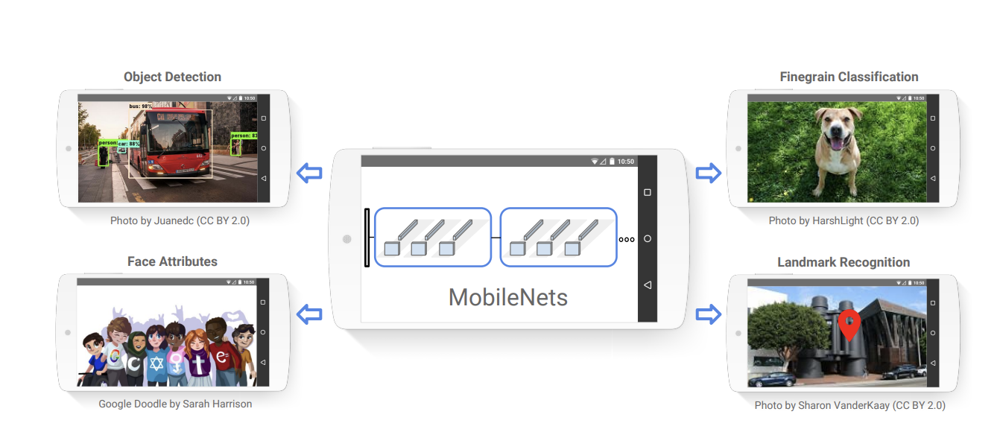

In [566]:
Image(filename='mobilenet.png')

#### Steps in Depthwise Convolution
1. Separation of Channels: Standard convolution applies filters to each channel of the input image. Whereas depthwise convolution only applies a single filter per input channel.
2. Filter Application: As each filter is applied independently, the output is the result of convolving (multiplication and summation) a single input channel with a dedicated filter.
3. Output Channels: The output of the depthwise convolution has the same number of channels as the input.
4. Reduced Complexity: Compared to standard convolution, the total number of multiplicative operations is reduced.
For standard convolution the total number of multiplicative operations = 𝐾×𝐾×𝐶×𝐷×height×width
For depthwise convolution, the number of operations = 𝐾×𝐾×𝐶× height×width

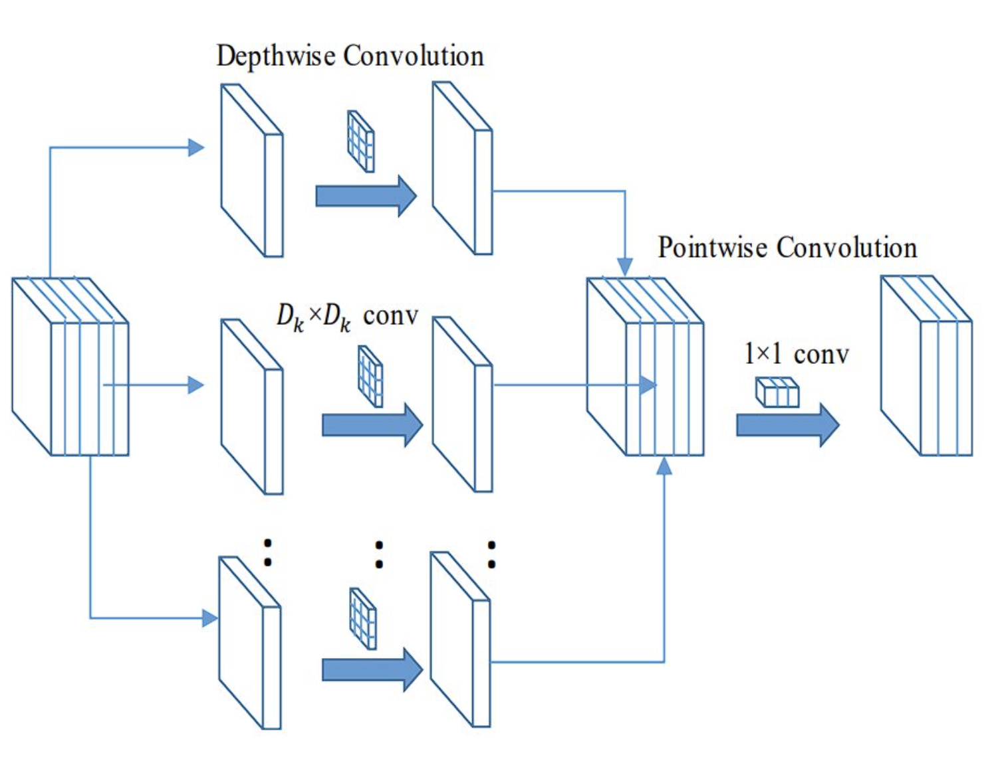

In [571]:
Image(filename='mobdp.png')

#### Pointwise Convolution

To combine features or expand channels, the output of depthwise convolution is applied with pointwise convolution. This is a 1×1 filter, which is applied to each pixel. This combines or expands the channels.

Combining Channel Features: Depthwise convolution processes each input channel separately, therefore interaction between channels doesn’t happen. Pointwise convolution combines these independently processed channel features to create a new feature map. This allows the model to learn from the entire depth of feature maps.

Increases Model Capacity: The interactions between the channels increase the representational capacity of the network. The model can learn complex patterns that depend on the relationships between different feature channels.
Adjusting the Number of Channels: Pointwise convolution enables increasing or decreasing the number of channels in the output feature map.


In [574]:
X_train_mobile,X_test_mobile, y_train_mobile, y_test_mobile = train_test_split(X,y, random_state = seed)

In [576]:
y_train_mobile = to_categorical(y_train_mobile , num_classes = 3 )
y_test_mobile = to_categorical(y_test_mobile, num_classes = 3 )

In [578]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_mobile, y_train_mobile)
test_itr = testdatagen.flow(X_test_mobile, y_test_mobile)

In [580]:
input_shape = (224,224,3)
base_model = keras.applications.MobileNet(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

In [582]:
len(base_model.layers)

87

In [586]:
base_model.trainable = True

fine_tune_at = 40
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [596]:
# building fully connected layers
def mobilenet():
    mobilenet= Sequential()
    
    mobilenet.add(Input(shape=input_shape))
    
    mobilenet.add(base_model)
    
    mobilenet.add(Dense(512, activation='relu'))
    mobilenet.add(Dense(3, activation='softmax'))
    
    mobilenet.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return mobilenet

In [598]:
mobilenet = mobilenet()

In [600]:
mobilenet.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenet_1.00_224 (Functional) │ (None, 1024)           │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,755,203 (14.32 MB)

 Trainable params: 526,339 (2.01 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [594]:
# tf.keras.backend.clear_session()

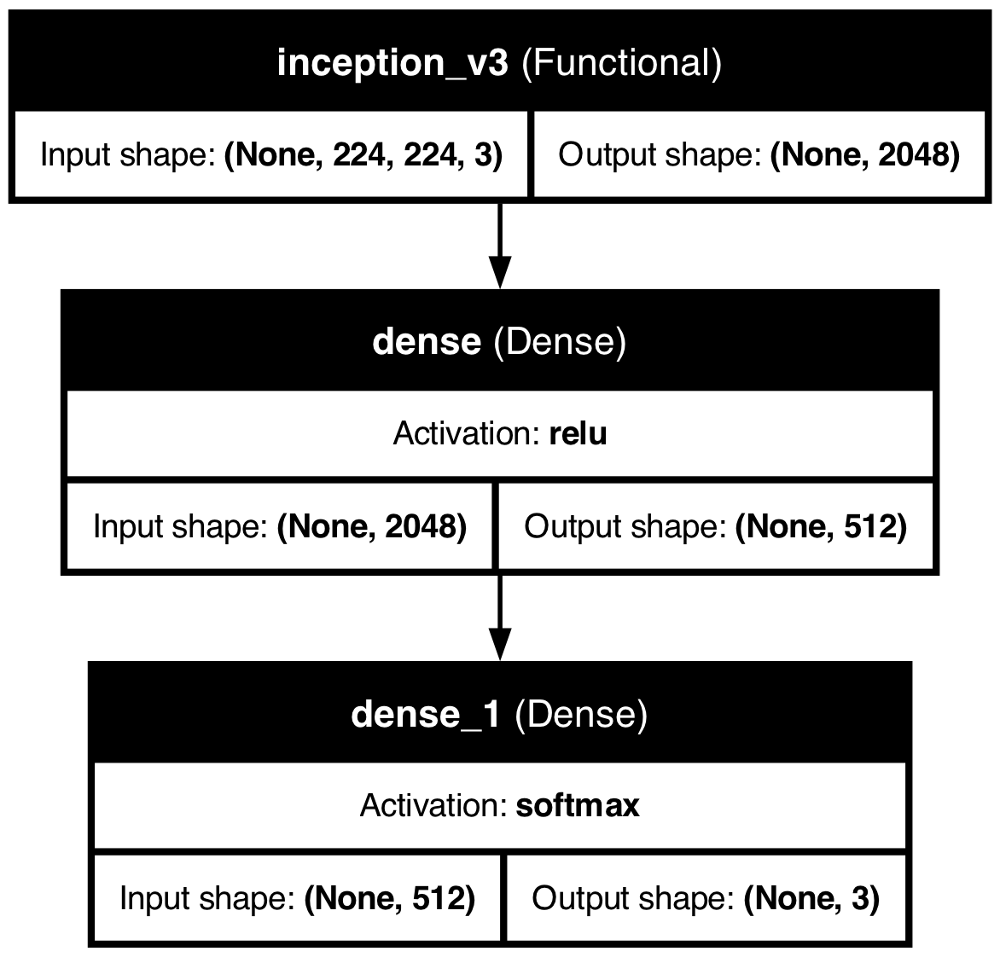

In [602]:
tf.keras.utils.plot_model(
    inception,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

In [604]:
history = mobilenet.fit(train_itr, epochs=50,validation_data = test_itr, verbose=1)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.3088 - loss: 11.1935 - val_accuracy: 0.4333 - val_loss: 15.4685
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.3856 - loss: 13.9595 - val_accuracy: 0.2667 - val_loss: 7.1662
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - accuracy: 0.4881 - loss: 4.0075 - val_accuracy: 0.3000 - val_loss: 7.3493
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.3828 - loss: 6.2912 - val_accuracy: 0.4667 - val_loss: 3.5223
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 140ms/step - accuracy: 0.4725 - loss: 2.6219 - val_accuracy: 0.6000 - val_loss: 1.1514
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.5094 - loss: 1.9650 - val_accuracy: 0.4000 - val_loss: 1.6281
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.5504 - loss: 1.6230 - val_accuracy: 0.6000 - val_loss: 1.7838
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - accuracy: 0.6250 - loss: 1.3733 - val_accuracy: 0.5000 - val_loss:

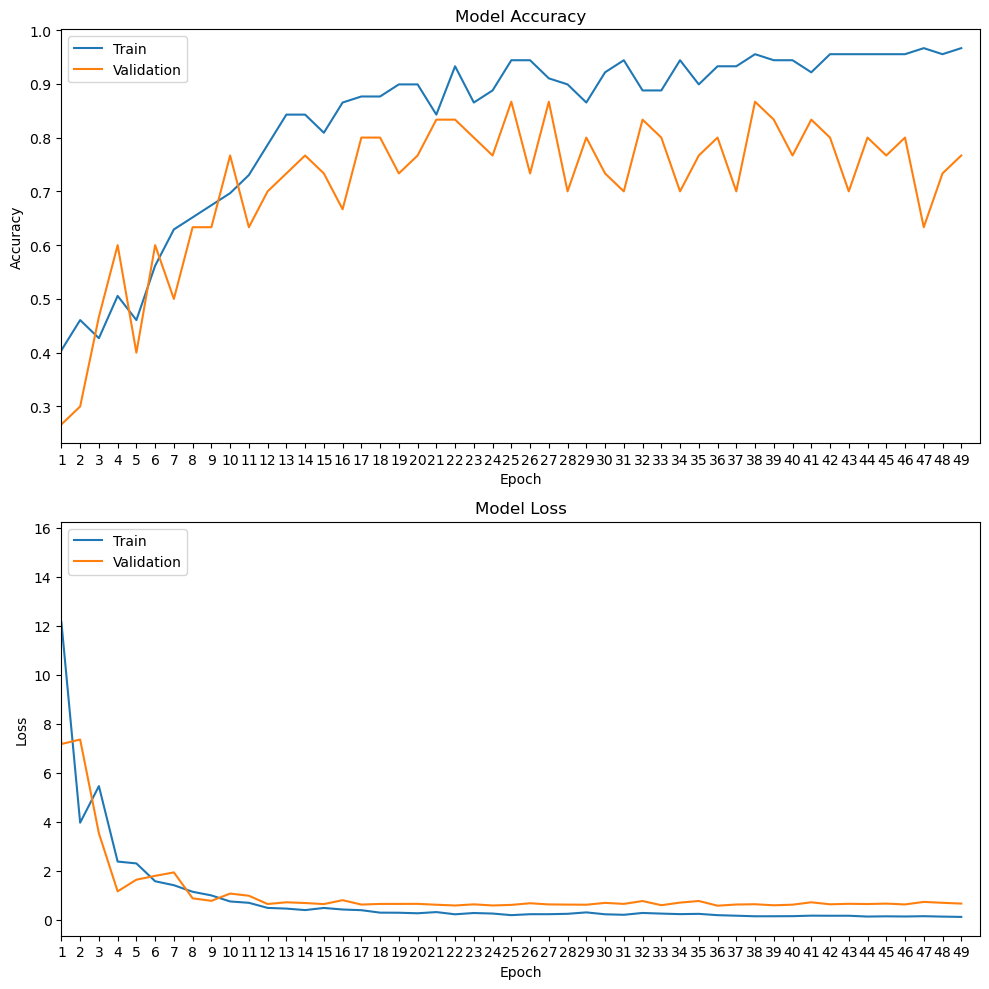

In [606]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [610]:
y_pred_mobilenet = mobilenet.predict(X_test_mobile)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [612]:
score = mobilenet.evaluate(X_test_mobile, y_test_mobile, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.7667 - loss: 0.6527


In [614]:
print('loss',score[0])
print('accuracy',score[1])

loss 0.6526931524276733
accuracy 0.7666666507720947


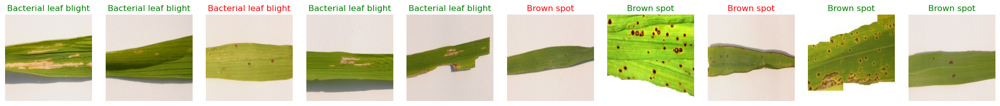

In [618]:
test_classes = np.argmax(y_test_mobile, axis = 1)
num_images = 10
pred_classes = np.argmax(y_pred_mobilenet, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test[i])
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

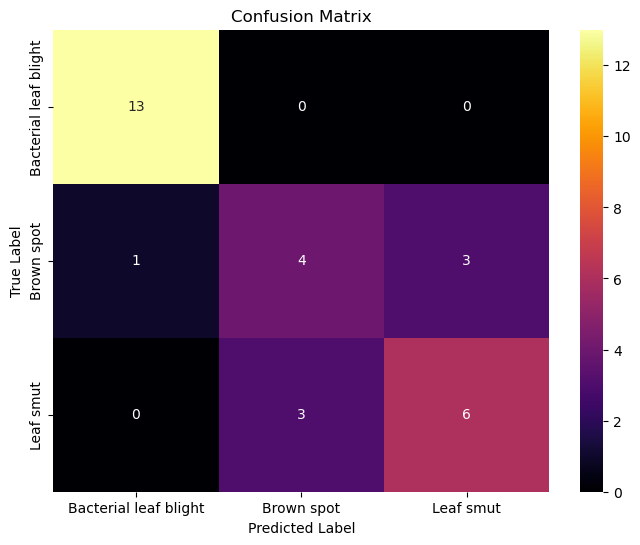

In [620]:
confusion_matrixes(test_classes,pred_classes)

### MobileNet perform very well on small test dataset with accuray of 0.76(76%) and loss of 0.65

# Xception

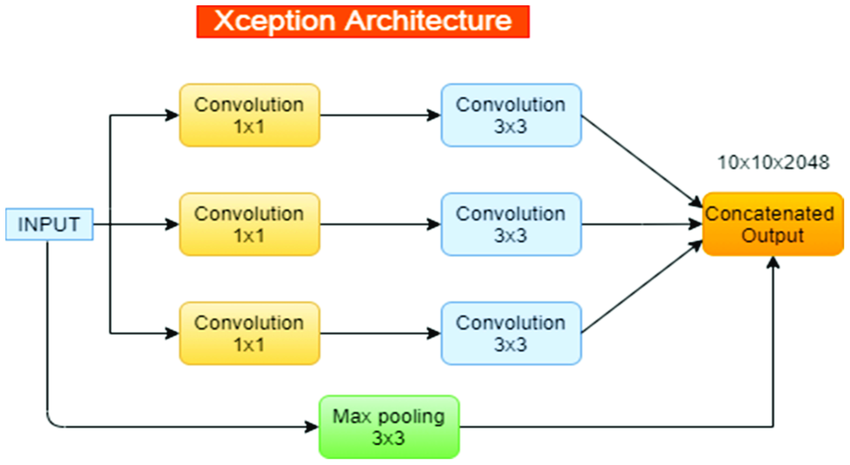

In [623]:
Image(filename='xception.png')

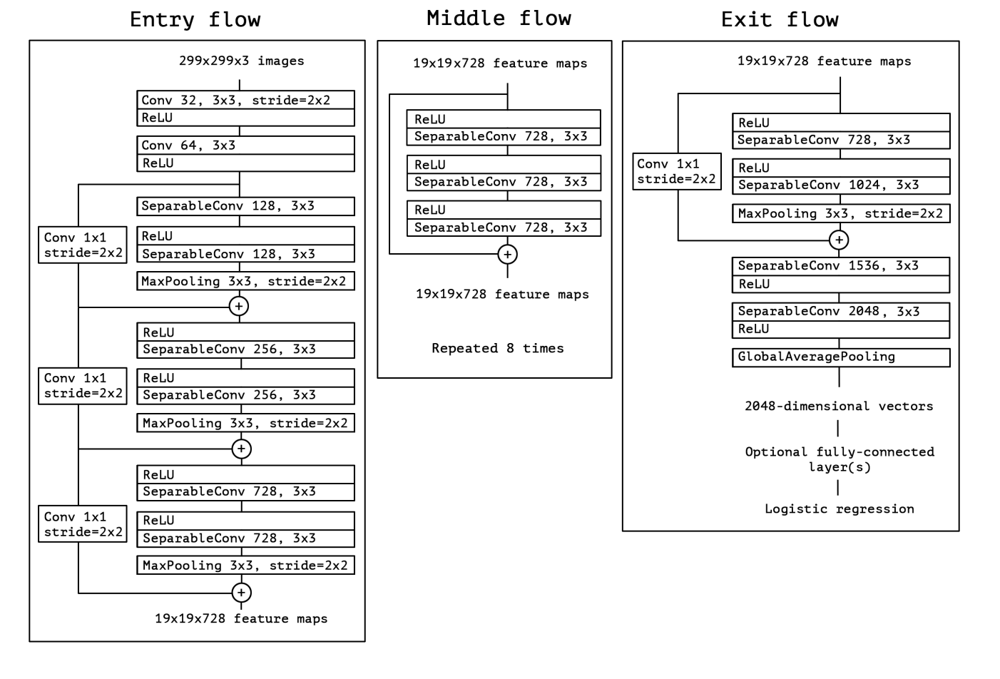

In [625]:
Image(filename='xception2.png')

The Xception network is a deep convolutional neural network architecture that improves on the Inception model by using depthwise separable convolutions, which are more efficient. It was developed by François Chollet and is known for its high performance in image classification tasks. The architecture consists of 36 convolutional layers structured into 14 modules, with linear residual connections, making it both powerful and computationally efficient. Xception is widely used for tasks like image classification and transfer learning.








In [21]:
X_train_xception,X_test_xception, y_train_xception, y_test_xception = train_test_split(X,y, random_state = seed)

In [25]:
X_train_xception = tf.image.resize(X_train_xception, (299, 299))
X_test_xception = tf.image.resize(X_test_xception, (299, 299))

In [27]:
X_train_xception= X_train_xception.numpy()

In [29]:
X_test_xception= X_test_xception.numpy()

In [31]:
X_train_xception.shape

(89, 299, 299, 3)

In [33]:
y_train_xception = to_categorical(y_train_xception , num_classes = 3 )
y_test_xception = to_categorical(y_test_xception, num_classes = 3 )

In [35]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_xception, y_train_xception)
test_itr = testdatagen.flow(X_test_xception, y_test_xception)

In [37]:
input_shape = (299,299,3)
base_model = keras.applications.Xception(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 27s 0us/step


In [39]:
len(base_model.layers)

133

In [43]:
base_model.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 149, 149,  │        864 │ input_layer[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 149, 149,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 149, 149,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 147, 147,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 147, 147,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 147, 147,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 147, 147,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 147, 147,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 147, 147,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 147, 147,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 147, 147,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 74, 74,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 74, 74,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 74, 74,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 74, 74,    │          0 │ add[0][0]       

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 12,706,296 (48.47 MB)

 Non-trainable params: 8,155,184 (31.11 MB)

In [41]:
base_model.trainable = True

fine_tune_at = 80
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [45]:
# building fully connected layers
def xception():
    xception= Sequential()
    
    xception.add(Input(shape=input_shape))
    
    xception.add(base_model)
    
    xception.add(Dense(2048, activation='relu'))
    xception.add(Dense(3, activation='softmax'))
    
    xception.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return xception

In [47]:
xception = xception()

In [49]:
xception.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ xception (Functional)           │ (None, 2048)           │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     4,196,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         6,147 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,063,979 (95.61 MB)

 Trainable params: 16,908,795 (64.50 MB)

 Non-trainable params: 8,155,184 (31.11 MB)

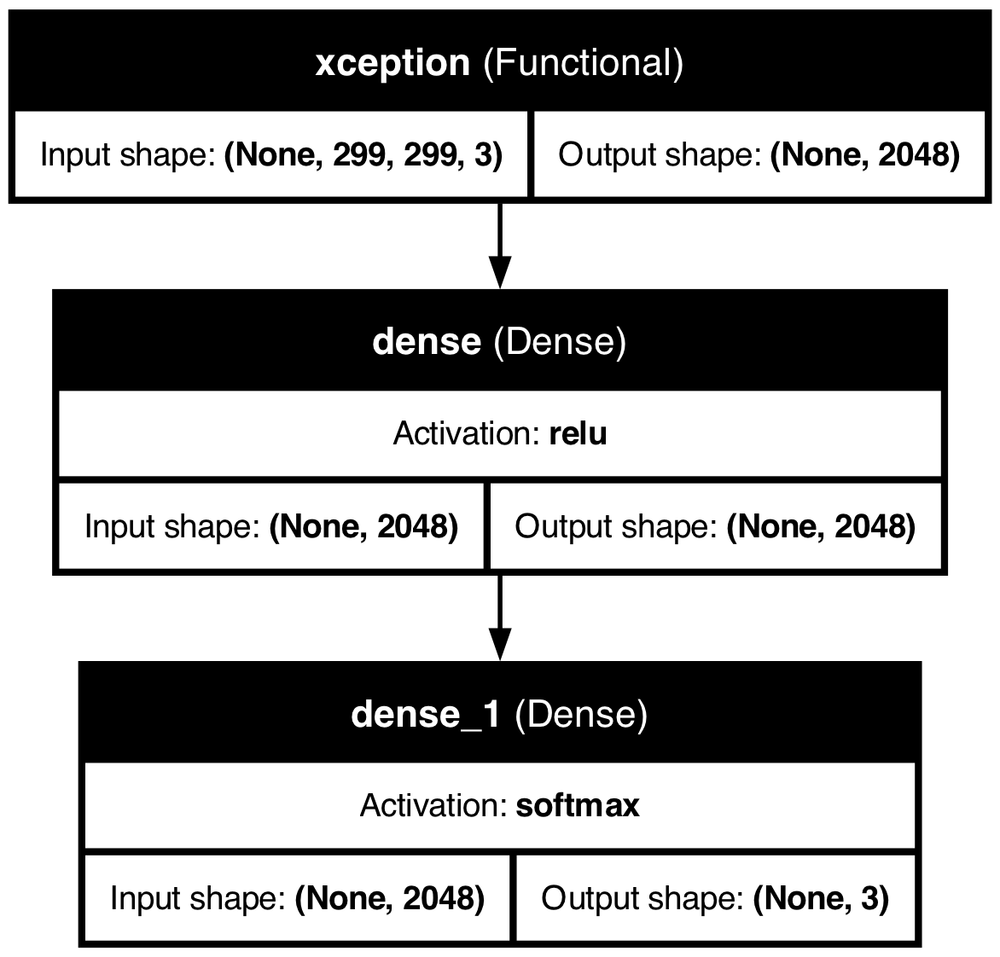

In [57]:
tf.keras.utils.plot_model(
    xception,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

In [59]:
history = xception.fit(train_itr, epochs=50,validation_data = test_itr, verbose=1)

Epoch 1/50


2024-08-15 13:59:24.896995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - accuracy: 0.3031 - loss: 3.3612 - val_accuracy: 0.3667 - val_loss: 34.5653
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.3075 - loss: 1.0991 - val_accuracy: 0.3667 - val_loss: 7.4386
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.2975 - loss: 1.0992 - val_accuracy: 0.3667 - val_loss: 2.5828
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.2975 - loss: 1.0983 - val_accuracy: 0.3667 - val_loss: 1.5047
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.3326 - loss: 1.0811 - val_accuracy: 0.3667 - val_loss: 1.2351
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.4256 - loss: 1.0644 - val_accuracy: 0.3667 - val_loss: 1.1470
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.4572 - loss: 1.0660 - val_accuracy: 0.3333 - val_loss: 1.1196
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.4791 - loss: 1.0564 - val_accuracy: 0.3667 - val_loss: 1.1077
Epoch 9/50
3/3 ━━━━━━━━━━

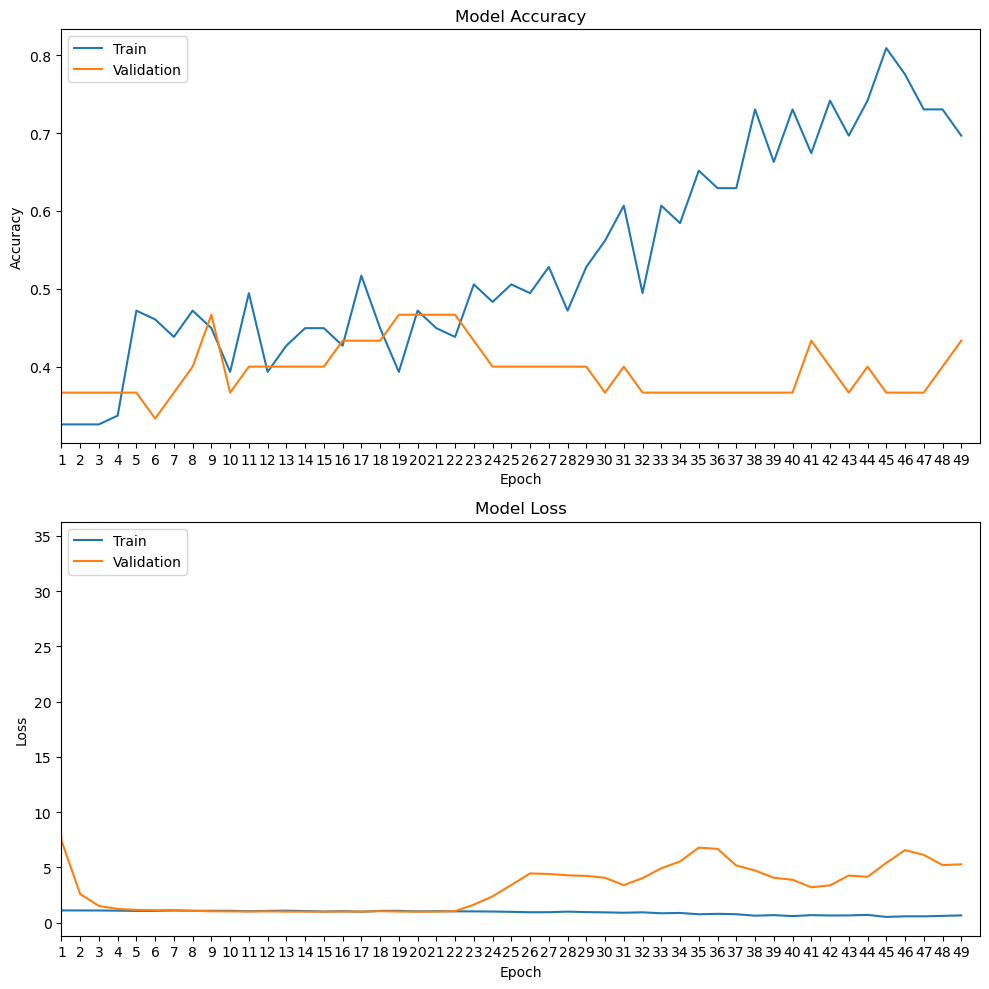

In [63]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [65]:
y_pred_xception = xception.predict(X_test_xception)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [67]:
score = xception.evaluate(X_test_xception, y_test_xception, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.4333 - loss: 5.2721


In [69]:
print('loss',score[0])
print('accuracy',score[1])

loss 5.27205228805542
accuracy 0.4333333373069763


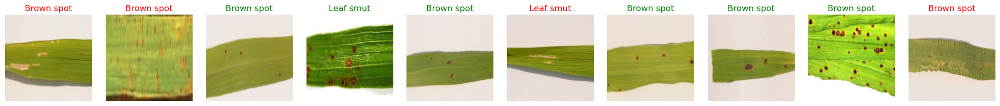

In [91]:
test_classes = np.argmax(y_test_xception, axis = 1)
num_images = 10
pred_classes = np.argmax(y_pred_xception, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test_xception[i].astype("uint8"))
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

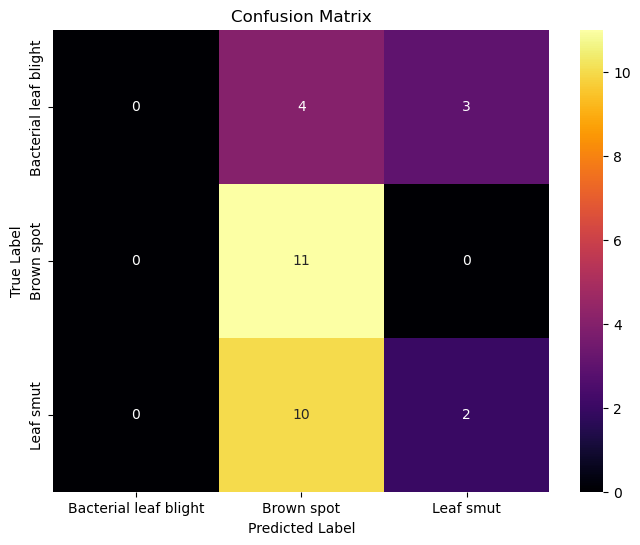

In [95]:
confusion_matrixes(test_classes, pred_classes)

### xception net is not good at small dataset having accuracy of 56% and loss of 5.27

# DenseNet

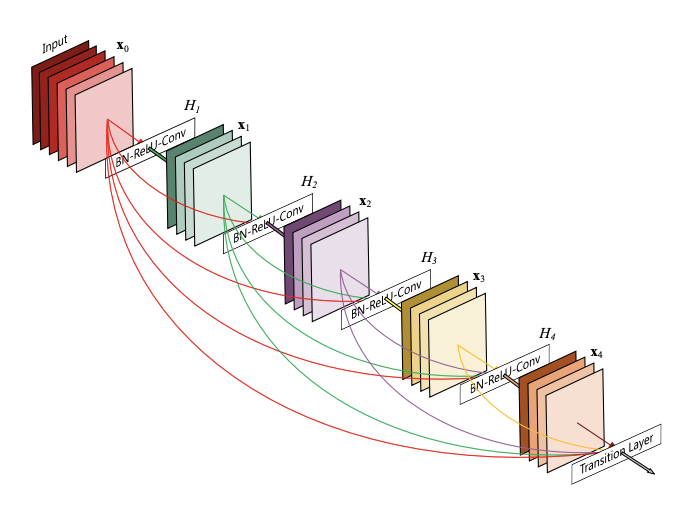

In [100]:
Image(filename='densenet1.png')

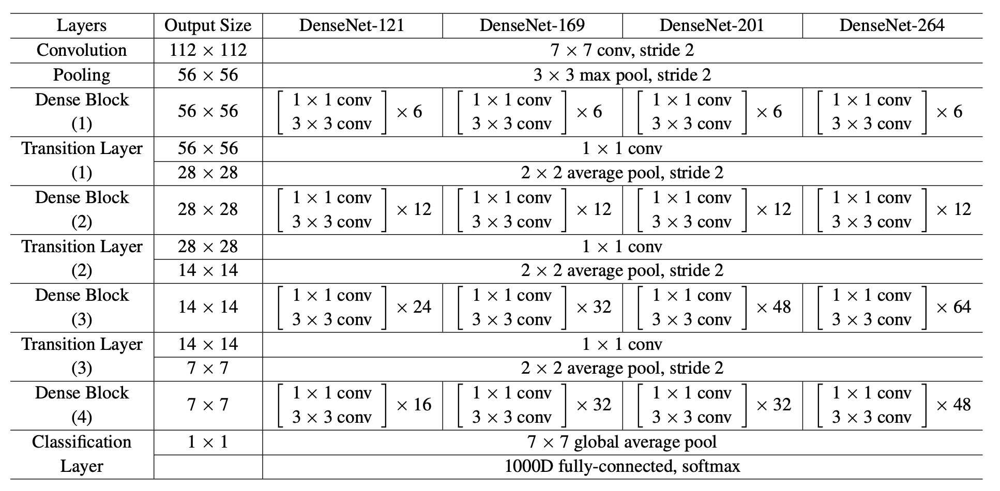

In [102]:
Image(filename='densenet2.png')

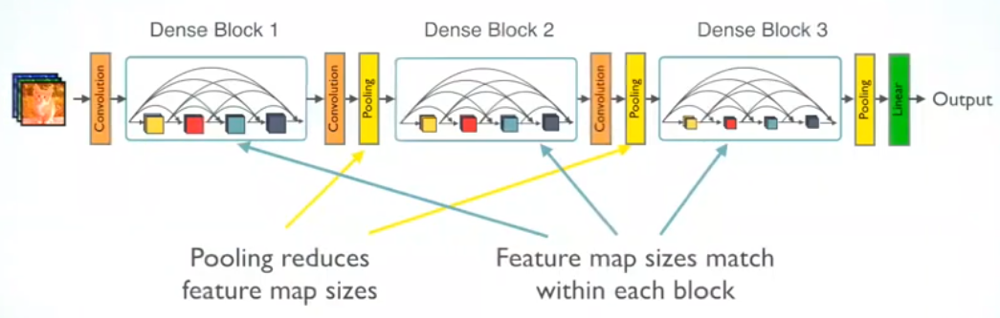

In [108]:
Image(filename='dense3.png')

#### Dense Connections:

Unlike traditional convolutional networks, where each layer has its own set of weights and the output from one layer is passed to the next layer, DenseNet connects each layer to every other layer in a feed-forward fashion.

Specifically, each layer receives the feature maps of all preceding layers as input. This is achieved by concatenating the output feature maps of the previous layers.

__Feature Reuse:__

1. Due to the dense connections, DenseNet allows feature reuse. This means that the network can leverage the features learned by earlier layers, making the network more efficient and reducing the number of parameters.
Fewer Parameters:

2. Despite being deep, DenseNet often has fewer parameters compared to other architectures like ResNet because it doesn't need to learn redundant features multiple times. This makes DenseNet more parameter-efficient.

__Composite Function:__

1. Each layer in a DenseNet typically performs a series of operations: Batch Normalization, followed by a ReLU activation, and then a convolution operation.

__Dense Blocks and Transition Layers:__

1. __Dense Block:__

A series of layers where each layer is connected to every other layer in a dense manner.

__Transition Layer:__

Between two dense blocks, there is a transition layer that includes a batch normalization layer, a 1x1 convolutional layer (to reduce the number of channels), and a 2x2 average pooling layer (to reduce the size of feature maps).

__Growth Rate:__

The growth rate (k) in DenseNet determines the number of filters added by each layer. If the growth rate is 32, each layer adds 32 feature maps. The growth rate controls how quickly the number of feature maps increases as layers are added.

__Common Variants:__

DenseNet is commonly used in several variants based on the depth and growth rate. Examples include:

1. DenseNet-121: 121 layers deep.
2. DenseNet-169
3. DenseNet-201
4. DenseNet-264

In [163]:
X_train_dense,X_test_dense, y_train_dense, y_test_dense = train_test_split(X,y, random_state = seed)

In [165]:
y_train_dense = to_categorical(y_train_dense , num_classes = 3 )
y_test_dense = to_categorical(y_test_dense, num_classes = 3 )

In [167]:
datagen = ImageDataGenerator(
    rotation_range = 40, # rotate image to avoide overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    fill_mode = 'nearest'
)

testdatagen = ImageDataGenerator(fill_mode = 'nearest')

train_itr = datagen.flow(X_train_dense, y_train_dense)
test_itr = testdatagen.flow(X_test_dense, y_test_dense)

In [169]:
input_shape = (224,224,3)
base_model = keras.applications.DenseNet121(
    include_top= False,
    weights="imagenet",
    pooling = 'max',
    input_shape = (input_shape) 
)

In [170]:
base_model.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 6,953,856 (26.53 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [171]:
len(base_model.layers)

428

In [172]:
base_model.trainable = True

fine_tune_at = 350
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [173]:
 # tf.keras.backend.clear_session()

In [179]:
# building fully connected layers
def densenet():
    densenet= Sequential()
    
    densenet.add(Input(shape=input_shape))
    
    densenet.add(base_model)
    
    densenet.add(Dense(1024, activation='relu'))
    densenet.add(Dense(3, activation='softmax'))
    
    densenet.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return densenet

In [181]:
densenet = densenet()

In [183]:
densenet.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 1024)           │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,090,179 (30.86 MB)

 Trainable params: 2,651,459 (10.11 MB)

 Non-trainable params: 5,438,720 (20.75 MB)

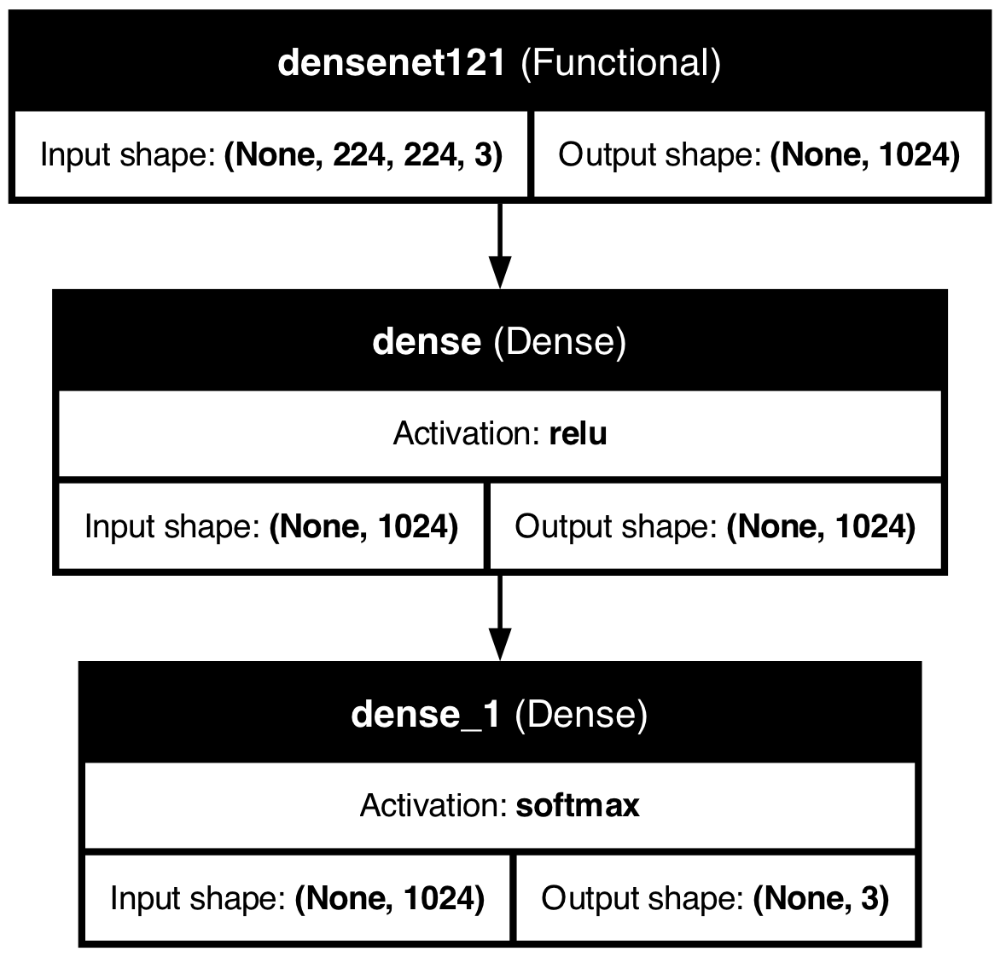

In [209]:
tf.keras.utils.plot_model(
    densenet,
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)


In [187]:
history = densenet.fit(train_itr, epochs=50,validation_data = test_itr, verbose=1)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 4s/step - accuracy: 0.3475 - loss: 12.0013 - val_accuracy: 0.3333 - val_loss: 56.0492
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 951ms/step - accuracy: 0.4032 - loss: 11.8168 - val_accuracy: 0.5000 - val_loss: 13.4835
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 818ms/step - accuracy: 0.5300 - loss: 3.2788 - val_accuracy: 0.3667 - val_loss: 16.5460
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 664ms/step - accuracy: 0.5106 - loss: 2.9383 - val_accuracy: 0.4333 - val_loss: 15.0092
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 695ms/step - accuracy: 0.7875 - loss: 0.6252 - val_accuracy: 0.3333 - val_loss: 10.2847
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 692ms/step - accuracy: 0.6634 - loss: 1.2095 - val_accuracy: 0.3333 - val_loss: 8.8055
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 719ms/step - accuracy: 0.8194 - loss: 0.6193 - val_accuracy: 0.3667 - val_loss: 7.0053
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 648ms/step - accuracy: 0.9588 - loss: 0.2567 - val_accuracy: 0.3667 - val_

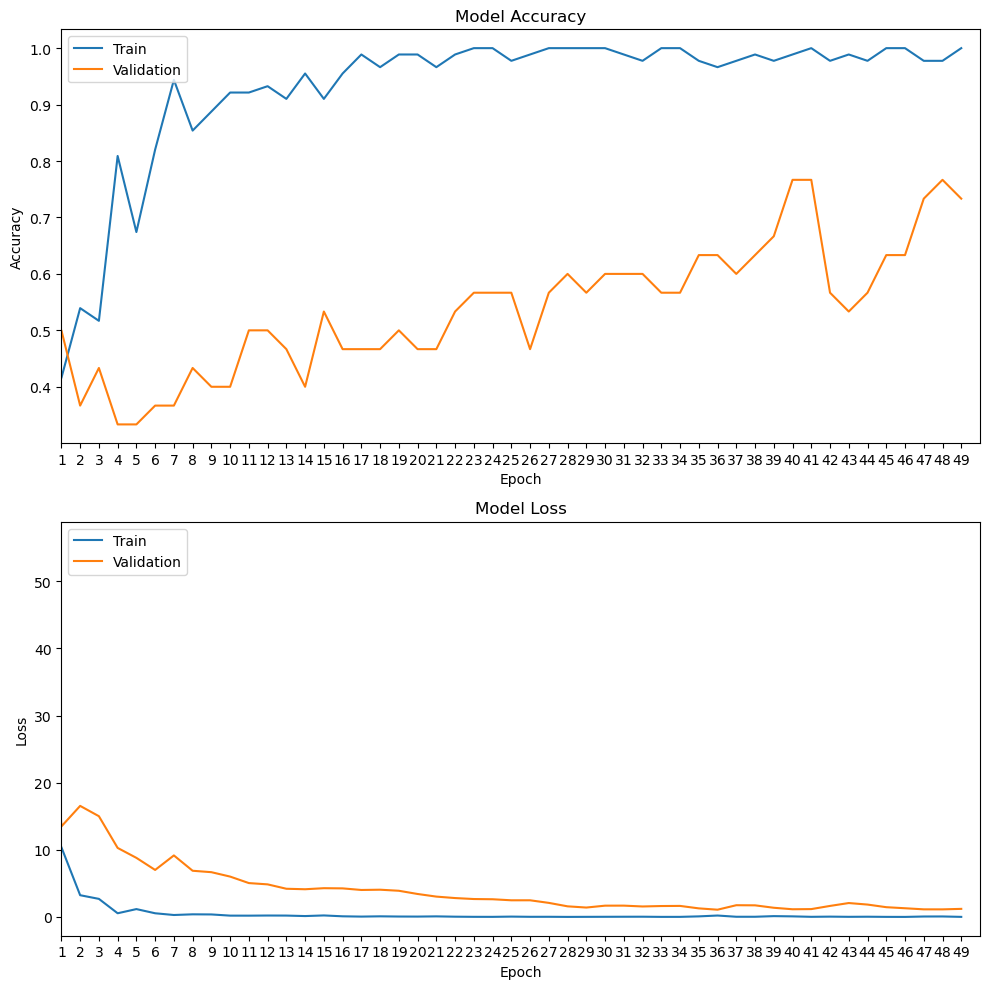

In [191]:
df = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot training & validation accuracy values
ax[0].plot(df['accuracy'])
ax[0].plot(df['val_accuracy'])
ax[0].set_xlim(1, len(df))
ax[0].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax[1].plot(df['loss'])
ax[1].plot(df['val_loss'])
ax[1].set_xlim(1, len(df))
ax[1].set_xticks(range(1, len(df)))  # Set x-axis ticks to integers
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [195]:
y_pred_densenet = densenet.predict(X_test_dense)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


In [197]:
score = densenet.evaluate(X_test_dense, y_test_dense, verbose= 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.7333 - loss: 1.2084


In [199]:
print('loss',score[0])
print('accuracy',score[1])

loss 1.2084294557571411
accuracy 0.7333333492279053


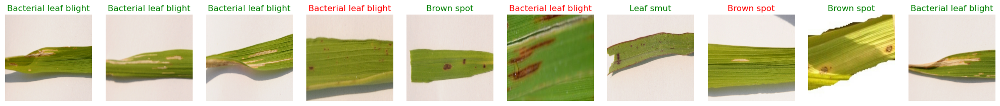

In [203]:
test_classes = np.argmax(y_test_dense, axis = 1)
num_images = 10
pred_classes = np.argmax(y_pred_densenet, axis =1)
# Create a figure
plt.figure(figsize=(num_images * 2, 4))

for i in range(num_images):
    # Display y_test images
    plt.subplot(2, num_images, i + 1)
    plt.imshow(X_test_dense[i].astype("uint8"))
    title_color = 'green' if label_to_class_name[test_classes[i]] == label_to_class_name[pred_classes[i]] else 'red'
    plt.title(f"{label_to_class_name[pred_classes[i]]}", color = title_color)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

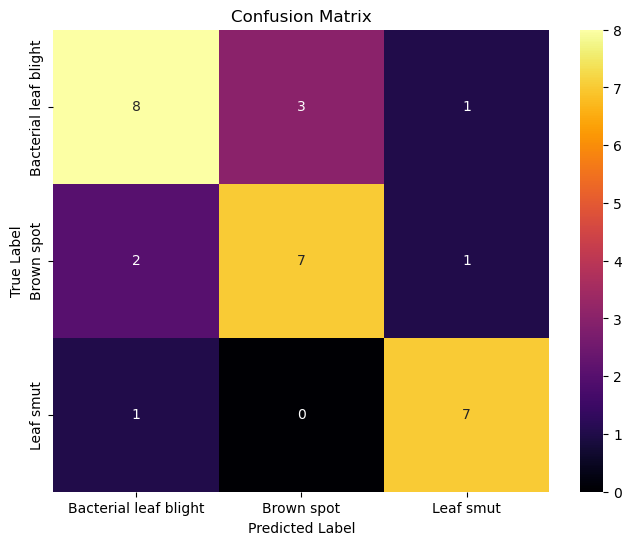

In [205]:
confusion_matrixes(test_classes, pred_classes)

### DenseNet is also performing well on small test dataset with accuracy of 73% and loss of 1.2

# Results

In [83]:
from prettytable import PrettyTable

In [85]:
z = PrettyTable()
z.field_names = ["Architecture","Accuracy","Loss"]
z.add_row(['5 layer CNN', '0.56', '3.51'])
z.add_row(['VGG16', '0.26', '1.3'])
z.add_row(['ResNet50', '0.93', '0.63'])
z.add_row(['Inceptionv3', '0.63', '0.93'])
z.add_row(['MobileNet', '0.76', '0.65'])
z.add_row(['Xception', '0.56', '5.65'])
z.add_row(['Densenet', '0.73', '1.2'])
z.padding_width = 3  # Increase padding width
z.horizontal_char = '-'  # Custom horizontal character
z.vertical_char = '|'  # Custom vertical character
z.junction_char = '+'  # Custom junction character
print(z)

+------------------+--------------+----------+
|   Architecture   |   Accuracy   |   Loss   |
+------------------+--------------+----------+
|   5 layer CNN    |     0.56     |   3.51   |
|      VGG16       |     0.26     |   1.3    |
|     ResNet50     |     0.93     |   0.63   |
|   Inceptionv3    |     0.63     |   0.93   |
|    MobileNet     |     0.76     |   0.65   |
|     Xception     |     0.56     |   5.65   |
|     Densenet     |     0.73     |   1.2    |
+------------------+--------------+----------+


# Here we can see that ResNet50 and DenseNet performing well on small dataset

# Summary

1. In the process of making the effective CNN model it can be observed that , working on the small dataset is a difficult task because many models are not performing well on test dataset because of less dataset
2. ResNet50 and MobileNet performing well on small dataset
3. Transferlearning with Fine Tuning also a good practise to be done with CNN models

# Challenges

1. Dataset is very small so there are high chances that model will be underfitted
2. Saving and loading the models